<a href="https://colab.research.google.com/github/sybrenh/GTLwebsite/blob/master/pdf_component_Detection_with_Detectron2_sybren_version.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Install Detectron2 dependencies: https://detectron2.readthedocs.io/tutorials/install.html (use cu100 because colab is on CUDA 10.0)
!pip install -U torch==1.4+cu100 torchvision==0.5+cu100 -f https://download.pytorch.org/whl/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
!pip install pycocotools==2.0.1

#!pip install awscli # you'll need this if you want to download images from Open Images (we'll see this later)

# Make sure we can import PyTorch (what Detectron2 is built with)
import torch, torchvision
torch.__version__
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 723.9MB 27kB/s 
     |████████████████████████████████| 4.1MB 32.6MB/s 
  Found existing installation: torch 1.5.1+cu101
    Uninstalling torch-1.5.1+cu101:
      Successfully uninstalled torch-1.5.1+cu101
  Found existing installation: torchvision 0.6.1+cu101
    Uninstalling torchvision-0.6.1+cu101:
      Successfully uninstalled torchvision-0.6.1+cu101
     |████████████████████████████████| 276kB 3.3MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44074 sha256=e1c992037f5760ac945ee4258681085bc8ab23ff24537e5a65d7cb90edaa1314
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-b

In [2]:
# install detectron2:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu100/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu100/index.html
     |████████████████████████████████| 6.7MB 615kB/s 
  Created wheel for fvcore: filename=fvcore-0.1.1.post20200716-cp36-none-any.whl size=42325 sha256=4bbbec9847d8508c9818844f2647962debf3f054ac8a21cac88ec80f1aa22e24
  Stored in directory: /root/.cache/pip/wheels/81/99/f4/42a6bef61c07b3d78dfe6d7ebff259444c4526504cf72378d7
Successfully built fvcore


In [3]:
import detectron2
detectron2.__version__

'0.2'

**Note:** After running the above two cells, you may need to restart your runtime (Runtime -> Restart runtime). After doing so, you can run the cells below as normal.

In [4]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger() # this logs Detectron2 information such as what the model is doing when it's training

# import some common libraries
import numpy as np
import pandas as pd
from tqdm import tqdm
import cv2
import os
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo # a series of pre-trained Detectron2 models: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md
from detectron2.engine import DefaultPredictor # a default predictor class to make predictions on an image using a trained model
from detectron2.config import get_cfg # a config of "cfg" in Detectron2 is a series of instructions for building a model
from detectron2.utils.visualizer import Visualizer # a class to help visualize Detectron2 predictions on an image
from detectron2.data import MetadataCatalog # stores information about the model such as what the training/test data is, what the class names are

In [5]:
from google.colab import drive
drive.mount("/content/drive")


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


## Run the pre-trained big dog model

In the Airbnb article, they mentioned they trained a full model on a dataset of 32K public images and 43K internal images. 

Since the public images are from the [Open Images dataset](https://storage.googleapis.com/openimages/web/index.html) (a dataset of images anyone can access), a big dog model was trained on as many of the public images as possible.

Specifically, a model was trained on 34,835 public images of Airbnb's target classes (see below).

For now, let's just download the full trained model, an example image of a room and see what happens when we make a prediction.


In [ ]:
# Download and display example image and save it as demo.jpeg
#!wget https://raw.githubusercontent.com/mrdbourke/airbnb-amenity-detection/master/custom_images/airbnb-article-cover.jpeg -O demo.jpeg
img = cv2.imread("/content/Seagreen SOV tender main document.pdf_IMAGE_0003.png")
cv2_imshow(img)

### Download the fully trained model
Let's download the trained model (we'll see how it was trained later) and its config.

In [6]:
#added siep
# Download the train model config hwarpan08 (instructions on how the model was built)
!wget https://raw.githubusercontent.com/hpanwar08/detectron2/master/configs/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml
!wget https://raw.githubusercontent.com/hpanwar08/detectron2/master/configs/Base-RCNN-FPN.yaml

--2020-07-24 12:25:47--  https://raw.githubusercontent.com/hpanwar08/detectron2/master/configs/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 592 [text/plain]
Saving to: ‘DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml’

DLA_mask_rcnn_X_101 100%[===================>]     592  --.-KB/s    in 0s      

2020-07-24 12:25:47 (33.1 MB/s) - ‘DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml’ saved [592/592]

--2020-07-24 12:25:48--  https://raw.githubusercontent.com/hpanwar08/detectron2/master/configs/Base-RCNN-FPN.yaml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent

In [18]:
# Download the trained model
# or add the pth thing manually
#!wget https://storage.googleapis.com/airbnb-amenity-detection-storage/airbnb-amenity-detection/open-images-data/retinanet_model_final/retinanet_model_final.pth 
!wget https://www.dropbox.com/sh/1098ym6vhad4zi6/AAD8Y-SVN6EbfAWEDYuZHG8xa/model_final_trimmed.pth?dl=0

--2020-07-24 12:36:15--  https://www.dropbox.com/sh/1098ym6vhad4zi6/AAD8Y-SVN6EbfAWEDYuZHG8xa/model_final_trimmed.pth?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.1, 2620:100:6018:1::a27d:301
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /sh/raw/1098ym6vhad4zi6/AAD8Y-SVN6EbfAWEDYuZHG8xa/model_final_trimmed.pth [following]
--2020-07-24 12:36:15--  https://www.dropbox.com/sh/raw/1098ym6vhad4zi6/AAD8Y-SVN6EbfAWEDYuZHG8xa/model_final_trimmed.pth
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uca5295f1d8ef759ce475320220d.dl.dropboxusercontent.com/cd/0/inline/A8Ioh8VArIwkbYkwrIK-Omiqe3e6l5TYYZU1p02KHWhQt-AqJgQ0jM63AR3FaWdk4CNU1y1iRRI1bug13XZNxroS4BLFQ6l7Z8_-1S9bYY_XvRPe2pqET34BK3DxA3Vpvi4/file# [following]
--2020-07-24 12:36:16--  https://uca5295f1d8ef759ce475320220d.dl.dropboxusercontent.com/cd/0/in

In [ ]:
# Download the trained model
#!wget https://storage.googleapis.com/airbnb-amenity-detection-storage/airbnb-amenity-detection/open-images-data/retinanet_model_final/retinanet_model_final.pth 

# Download the train model config (instructions on how the model was built)
#!wget https://storage.googleapis.com/airbnb-amenity-detection-storage/airbnb-amenity-detection/open-images-data/retinanet_model_final/retinanet_model_final_config.yaml

###  Classes



In [17]:
# Target classes with spaces removed
target_classes = ['text', 'title','figure', 'list', 'table']


# Not usefull stuff right now


Now we've got a fully trained model, a model config file, an example image and the target classes we're after, let's make an example prediction.

In [ ]:
img = cv2.imread("/content/drive/My Drive/medpaper.jpg")

In [ ]:
# Setup a model config file (set of instructions for the model)
cfg = get_cfg() # setup a default config, see: https://detectron2.readthedocs.io/modules/config.html
cfg.merge_from_file("/content/drive/My Drive/model/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml")#./retinanet_model_final_config.yaml") # merge the config YAML file (a set of instructions on how to build a model)
#/content/drive/My Drive/model/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml
cfg.MODEL.WEIGHTS = "/content/model_final_trimmed.pth?dl=0" #"./retinanet_model_final.pth" # setup the model weights from the fully trained model

# Create a default Detectron2 predictor for making inference
predictor = DefaultPredictor(cfg)

# Make a prediction the example image from above
outputs = predictor(img)

The predictions have been made, let's visualize them. We can do this using [Detectron2's Vizualizer class](https://detectron2.readthedocs.io/modules/utils.html#detectron2.utils.visualizer.Visualizer). 

In [ ]:
# Number of predicted amenities to draw on the target image
num_amenities = 7

# Set up a visulaizer instance: https://detectron2.readthedocs.io/modules/utils.html#detectron2.utils.visualizer.Visualizer
visualizer = Visualizer(img_rgb=img[:, :, ::-1], # we have to reverse the color order otherwise we'll get blue images (BGR -> RGB)
                        metadata=MetadataCatalog.get(cfg.DATASETS.TEST[0]).set(thing_classes=target_classes), # we tell the visualizer what classes we're drawing (from the target classes)
                        scale=0.7)

# Draw the models predictions on the target image
visualizer = visualizer.draw_instance_predictions(outputs["instances"][:num_amenities].to("cpu"))

# Display the image
cv2_imshow(visualizer.get_image()[:, :, ::-1])

# How to train your own custom model

Detectron2 comes with a [fair few pretrained models](https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md) on the [COCO dataset (common objects in context)](http://cocodataset.org/#home) but if you're like me, you're probably most interested in training on your own data.

The beautiful thing is, thanks to transfer learning, we can take the patterns the pretrained Detectron2 models have learned from the COCO dataset and update them with our own data.

To do so, we'll need to:
* Have our own data (this either exists already, or you'll have to collect it)
* Label our data in a compatiable format for Detectron2

In Airbnb's case, they used a combination of their own internal data (images people had uploaded to their site) as well as public data (Open Images).

Since we don't have access to Airbnb's internal data, we'll be using public data from [Open Images](https://storage.googleapis.com/openimages/web/index.html).

More specifially, to train our own custom model, we're going to do the following:
1. Download data (images) & label files from Open Images
2. Format the data (images) & label files to be compatiable with Detectron2
3. Download a pretrained Detectron2 model and update it (train it) with our own data
4. Verify the updated model works on our own images by making predictions
5. Formalling evaluate the model using a validation/test set and Detectron2 evaluators

As we go through, you'll notice most of the work is in steps 1 & 2.

This is because once you have your data ready and formatted, it slots quite nicely into Detectron2's training procedure.

To start getting the data ready, since we're using Open Images, we'll first [download the label files](https://storage.googleapis.com/openimages/web/download.html).  

# training sybren


In [ ]:
!pip install wandb

In [ ]:
!wandb login

wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: 2
wandb: You chose 'Use an existing W&B account'
wandb: You can find your API key in your browser here: https://app.wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: You can find your API key in your browser here: https://app.wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter: 6f81b5b2e2f64a7b99f0ecaec4ee079766da0835
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
Successfully logged in to Weights & Biases!


In [ ]:
import wandb
wandb.init(entity="dryrun", project="my-project1")

403 response executing GraphQL.
{"errors":[{"message":"permission denied","path":["upsertBucket"],"extensions":{"code":"PERMISSION_ERROR"}}],"data":{"upsertBucket":null}}
wandb: ERROR Error while calling W&B API: permission denied (<Response [403]>)
wandb: ERROR Permission denied to access wandb/my-project1/3t3onqya
403 response executing GraphQL.
{"errors":[{"message":"permission denied","path":["upsertBucket"],"extensions":{"code":"PERMISSION_ERROR"}}],"data":{"upsertBucket":null}}
wandb: ERROR Error while calling W&B API: permission denied (<Response [403]>)
communication error with wandb Permission denied to access wandb/my-project1/3t3onqya
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/wandb/retry.py", line 95, in __call__
    result = self._call_fn(*args, **kwargs)
  File "/usr/local/lib/python3.6/dist-packages/wandb/apis/internal.py", line 114, in execute
    six.reraise(*sys.exc_info())
  File "/usr/local/lib/python3.6/dist-packages/six.py", 

LaunchError: ignored

Error in callback <function _init_jupyter.<locals>.cleanup at 0x7f7fc0edad08> (for post_run_cell):


KeyboardInterrupt: ignored

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [43]:
#the real dataset, the one with test and train splitted
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train2", {}, "/content/drive/My Drive/manpower_dataset/train.json", "/content/drive/My Drive/manpower_dataset/outputim")
#/content/drive/My Drive/Seagreen SOV tender main document/train/Seagreen SOV tender main document.json
#register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test2", {}, "/content/drive/My Drive/manpower_dataset/test.json", "/content/drive/My Drive/manpower_dataset/outputim")


In [ ]:
#dataset is not splitted yet
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train7", {}, "/content/drive/My Drive/manpower_dataset/Phase_1-4.json", "/content/drive/My Drive/manpower_dataset/outputim")
#/content/drive/My Drive/Seagreen SOV tender main document/train/Seagreen SOV tender main document.json
#register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test7", {}, "/content/drive/My Drive/manpower_dataset/Phase_1-4.json", "/content/drive/My Drive/manpower_dataset/outputim")


In [ ]:
#%%writefile foo.py

import os
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

# Setup a model config (recipe for training a Detectron2 model)
cfg=get_cfg()

# Add some basic instructions for the Detectron2 model from the model_zoo: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md
cfg.merge_from_file("/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml")

# Add some pretrained model weights from an object detection model
cfg.MODEL.WEIGHTS = "/content/model_final_trimmed.pth?dl=0"

# Setup datasets to train/validate on (this will only work if the datasets are registered with DatasetCatalog)
cfg.DATASETS.TRAIN = ("my_dataset_train2",)
cfg.DATASETS.TEST = ("my_dataset_test2",)

# How many dataloaders to use? This is the number of CPUs to load the data into Detectron2, Colab has 2, so we'll use 2
cfg.DATALOADER.NUM_WORKERS = 2

# How many images per batch? The original models were trained on 8 GPUs with 16 images per batch, since we have 1 GPU: 16/8 = 2.
cfg.SOLVER.IMS_PER_BATCH = 2

# We do the same calculation with the learning rate as the GPUs, the original model used 0.01, so we'll divide by 8: 0.01/8 = 0.00125.
cfg.SOLVER.BASE_LR = 0.00125

# How many iterations are we going for? (300 is okay for our small model, increase for larger datasets)
cfg.SOLVER.MAX_ITER = 200

# ROI = region of interest, as in, how many parts of an image are interesting, how many of these are we going to find? 
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128

# We're only dealing with 2 classes (coffeemaker and fireplace) 
cfg.MODEL.RETINANET.NUM_CLASSES = 5 #changed siep

# Setup output directory, all the model artefacts will get stored here in a folder called "outputs" 
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Setup the default Detectron2 trainer, see: https://detectron2.readthedocs.io/modules/engine.html#detectron2.engine.defaults.DefaultTrainer
trainer = DefaultTrainer(cfg)

# Resume training from model checkpoint or not, we're going to just load the model in the config: https://detectron2.readthedocs.io/modules/engine.html#detectron2.engine.defaults.DefaultTrainer.resume_or_load
trainer.resume_or_load(resume=False) 

#added for wandb
wandb.watch()

# WandB – wandb.log(a_dict) logs the keys and values of the dictionary passed in and associates the values with a step.
# You can log anything by passing it to wandb.log, including histograms, custom matplotlib objects, images, video, text, tables, html, pointclouds and other 3D objects.
# Here we use it to log test accuracy, loss and some test images (along with their true and predicted labels).
# wandb.log({
#     "Examples": example_images,
#     "Test Accuracy": 100. * correct / len(test_loader.dataset),
#     "Test Loss": test_loss})


WARNING [07/23 12:39:53 d2.config.compat]: Config '/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml' has no VERSION. Assuming it to be compatible with latest v2.
[07/23 12:39:55 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3

TypeError: ignored

In [ ]:
import torch
# device = torch.device("cpu")
trainer.train()

[07/20 11:13:13 d2.engine.train_loop]: Starting training from iteration 0
[07/20 11:14:24 d2.utils.events]:  eta: 0:10:35  iter: 19  total_loss: 1.223  loss_cls: 0.467  loss_box_reg: 0.189  loss_mask: 0.409  loss_rpn_cls: 0.017  loss_rpn_loc: 0.091  time: 3.5393  data_time: 0.0332  lr: 0.000025  max_mem: 9033M
[07/20 11:15:32 d2.utils.events]:  eta: 0:09:23  iter: 39  total_loss: 1.049  loss_cls: 0.442  loss_box_reg: 0.174  loss_mask: 0.333  loss_rpn_cls: 0.021  loss_rpn_loc: 0.088  time: 3.4730  data_time: 0.0069  lr: 0.000050  max_mem: 9033M
[07/20 11:16:42 d2.utils.events]:  eta: 0:08:12  iter: 59  total_loss: 0.754  loss_cls: 0.188  loss_box_reg: 0.164  loss_mask: 0.220  loss_rpn_cls: 0.024  loss_rpn_loc: 0.077  time: 3.4740  data_time: 0.0070  lr: 0.000075  max_mem: 9033M
[07/20 11:17:50 d2.utils.events]:  eta: 0:07:02  iter: 79  total_loss: 0.598  loss_cls: 0.153  loss_box_reg: 0.153  loss_mask: 0.168  loss_rpn_cls: 0.015  loss_rpn_loc: 0.068  time: 3.4560  data_time: 0.0084  lr:

In [ ]:
#to run it as a progam instead of block of code
#!export CUDA_LAUNCH_BLOCKING=1; python3 foo.py

Make a prediction with the new model

In [ ]:
# Look at training curves in tensorboard (note: TensorBoard output usually works best in Google Chrome)
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1646), started 0:53:07 ago. (Use '!kill 1646' to kill it.)

<IPython.core.display.Javascript object>

# plain_train_net


In [ ]:
#the real dataset, the one with test and train splitted
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train2", {}, "/content/drive/My Drive/manpower_dataset/train.json", "/content/drive/My Drive/manpower_dataset/outputim")
#/content/drive/My Drive/Seagreen SOV tender main document/train/Seagreen SOV tender main document.json
#register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test2", {}, "/content/drive/My Drive/manpower_dataset/test.json", "/content/drive/My Drive/manpower_dataset/outputim")


In [7]:
import logging
import os
from collections import OrderedDict
import torch
from torch.nn.parallel import DistributedDataParallel

import detectron2.utils.comm as comm
from detectron2.checkpoint import DetectionCheckpointer, PeriodicCheckpointer
from detectron2.config import get_cfg
from detectron2.data import (
    MetadataCatalog,
    build_detection_test_loader,
    build_detection_train_loader,
)
from detectron2.engine import default_argument_parser, default_setup, launch
from detectron2.evaluation import (
    CityscapesInstanceEvaluator,
    CityscapesSemSegEvaluator,
    COCOEvaluator,
    COCOPanopticEvaluator,
    DatasetEvaluators,
    LVISEvaluator,
    PascalVOCDetectionEvaluator,
    SemSegEvaluator,
    inference_on_dataset,
    print_csv_format,
)
from detectron2.modeling import build_model
from detectron2.solver import build_lr_scheduler, build_optimizer
from detectron2.utils.events import (
    CommonMetricPrinter,
    EventStorage,
    JSONWriter,
    TensorboardXWriter,
)

logger = logging.getLogger("detectron2")


In [8]:
def get_evaluator(cfg, dataset_name, output_folder=None):
    """
    Create evaluator(s) for a given dataset.
    This uses the special metadata "evaluator_type" associated with each builtin dataset.
    For your own dataset, you can simply create an evaluator manually in your
    script and do not have to worry about the hacky if-else logic here.
    """
    if output_folder is None:
        output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
    evaluator_list = []
    evaluator_type = MetadataCatalog.get(dataset_name).evaluator_type
    if evaluator_type in ["sem_seg", "coco_panoptic_seg"]:
        evaluator_list.append(
            SemSegEvaluator(
                dataset_name,
                distributed=True,
                num_classes=cfg.MODEL.SEM_SEG_HEAD.NUM_CLASSES,
                ignore_label=cfg.MODEL.SEM_SEG_HEAD.IGNORE_VALUE,
                output_dir=output_folder,
            )
        )
    if evaluator_type in ["coco", "coco_panoptic_seg"]:
        evaluator_list.append(COCOEvaluator(dataset_name, cfg, True, output_folder))
    if evaluator_type == "coco_panoptic_seg":
        evaluator_list.append(COCOPanopticEvaluator(dataset_name, output_folder))
    if evaluator_type == "cityscapes_instance":
        assert (
            torch.cuda.device_count() >= comm.get_rank()
        ), "CityscapesEvaluator currently do not work with multiple machines."
        return CityscapesInstanceEvaluator(dataset_name)
    if evaluator_type == "cityscapes_sem_seg":
        assert (
            torch.cuda.device_count() >= comm.get_rank()
        ), "CityscapesEvaluator currently do not work with multiple machines."
        return CityscapesSemSegEvaluator(dataset_name)
    if evaluator_type == "pascal_voc":
        return PascalVOCDetectionEvaluator(dataset_name)
    if evaluator_type == "lvis":
        return LVISEvaluator(dataset_name, cfg, True, output_folder)
    if len(evaluator_list) == 0:
        raise NotImplementedError(
            "no Evaluator for the dataset {} with the type {}".format(dataset_name, evaluator_type)
        )
    if len(evaluator_list) == 1:
        return evaluator_list[0]
    return DatasetEvaluators(evaluator_list)

In [59]:
def do_test(cfg, model):
    results = OrderedDict()
    for dataset_name in cfg.DATASETS.TEST:
        data_loader = build_detection_test_loader(cfg, dataset_name)
        evaluator = get_evaluator(
            cfg, dataset_name, os.path.join(cfg.OUTPUT_DIR, "inference", dataset_name)
        )
        results_i = inference_on_dataset(model, data_loader, evaluator)
        results[dataset_name] = results_i
        if comm.is_main_process():
            logger.info("Evaluation results for {} in csv format:".format(dataset_name))
            print_csv_format(results_i)
    if len(results) == 1:
        results = list(results.values())[0]
    
    wandb.log(results_i)
    return results

In [63]:
def do_train(cfg, model, resume=False):
    model.train()
    optimizer = build_optimizer(cfg, model)
    scheduler = build_lr_scheduler(cfg, optimizer)

    checkpointer = DetectionCheckpointer(
        model, cfg.OUTPUT_DIR, optimizer=optimizer, scheduler=scheduler
    )
    start_iter = (
        checkpointer.resume_or_load(cfg.MODEL.WEIGHTS, resume=resume).get("iteration", -1) + 1
    )
    max_iter = cfg.SOLVER.MAX_ITER

    periodic_checkpointer = PeriodicCheckpointer(
        checkpointer, cfg.SOLVER.CHECKPOINT_PERIOD, max_iter=max_iter
    )

    writers = (
        [
            CommonMetricPrinter(max_iter),
            JSONWriter(os.path.join(cfg.OUTPUT_DIR, "metrics.json")),
            TensorboardXWriter(cfg.OUTPUT_DIR),
        ]
        if comm.is_main_process()
        else []
    )

    # TODO: wandb.log()? log the losses
    wandb.log({
        "Total loss": losses_reduced
    })


    # compared to "train_net.py", we do not support accurate timing and
    # precise BN here, because they are not trivial to implement in a small training loop
    data_loader = build_detection_train_loader(cfg)
    logger.info("Starting training from iteration {}".format(start_iter))
    with EventStorage(start_iter) as storage:
        for data, iteration in zip(data_loader, range(start_iter, max_iter)):
            iteration = iteration + 1
            storage.step()

            loss_dict = model(data)
            losses = sum(loss_dict.values())
            assert torch.isfinite(losses).all(), loss_dict

            loss_dict_reduced = {k: v.item() for k, v in comm.reduce_dict(loss_dict).items()}
            losses_reduced = sum(loss for loss in loss_dict_reduced.values())
            if comm.is_main_process():
                storage.put_scalars(total_loss=losses_reduced, **loss_dict_reduced)

            optimizer.zero_grad()
            losses.backward()
            optimizer.step()
            storage.put_scalar("lr", optimizer.param_groups[0]["lr"], smoothing_hint=False)
            scheduler.step()

            if (
                cfg.TEST.EVAL_PERIOD > 0
                and iteration % cfg.TEST.EVAL_PERIOD == 0
                and iteration != max_iter
            ):
                do_test(cfg, model)
                # Compared to "train_net.py", the test results are not dumped to EventStorage
                comm.synchronize()

            if iteration - start_iter > 5 and (iteration % 20 == 0 or iteration == max_iter):
                for writer in writers:
                    writer.write()
            periodic_checkpointer.step(iteration)

In [64]:
def setup(args):
    """
    Create configs and perform basic setups.
    """
    cfg = get_cfg()
    cfg.merge_from_file("/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml")#args.config_file)
    cfg.merge_from_list(args.opts)
    cfg.freeze()
    default_setup(
        cfg, args
    )  # if you don't like any of the default setup, write your own setup code

    wandb.init(project="finetunewb", sync_tensorboard=True)
    #wandb.config.update(cfg_yaml)
    return cfg

In [65]:
def main(args):
    cfg = setup(args)

    model = build_model(cfg)
    logger.info("Model:\n{}".format(model))
    if args.eval_only:
        DetectionCheckpointer(model, save_dir=cfg.OUTPUT_DIR).resume_or_load(
            cfg.MODEL.WEIGHTS, resume=args.resume
        )
        return do_test(cfg, model)

    distributed = comm.get_world_size() > 1
    if distributed:
        model = DistributedDataParallel(
            model, device_ids=[comm.get_local_rank()], broadcast_buffers=False
        )

    do_train(cfg, model, resume=args.resume)
    return do_test(cfg, model)

In [ ]:
#not nessesary
if __name__ == "__main__":
    args = default_argument_parser().parse_args()
    print("Command Line Args:", args)
    launch(
        main,
        args.num_gpus,
        num_machines=args.num_machines,
        machine_rank=args.machine_rank,
        dist_url=args.dist_url,
        args=(args,),
    )

In [15]:
# Setup arg parser
parser = default_argument_parser() # default in Detectron2

In [20]:
# Target classes with spaces removed
target_classes = ['text', 'title','figure', 'list', 'table']


In [25]:
# Different models I'd like to try - https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md
models_to_try = {
    #"RN-R50-1x": "COCO-Detection/retinanet_R_50_FPN_1x.yaml",
    #"RN-R50-3x": "COCO-Detection/retinanet_R_50_FPN_3x.yaml",
    "RN-R101-3x": "/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml"
}

In [31]:
# Setup arg parser
parser = default_argument_parser() # default in Detectron2

In [66]:
# Setup different weights and config files to try
weights = []
configs = []
for k, v in models_to_try.items():
  model = models_to_try[k]
  model_weights = "/content/model_final_trimmed.pth?dl=0" #model_zoo.get_checkpoint_url(model)
  weights.append(model_weights)
  config_file = "/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml" #model_zoo.get_config_file(model)
  configs.append(config_file)
weights_configs = dict(zip(weights, configs))
weights_configs

{'/content/model_final_trimmed.pth?dl=0': '/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml'}

In [44]:
# Setup different arg strings to pass to main() 
workers = 2
ims_per_batch = 2
# For transfer learning, divide LR by 10
lr = 0.000125 # divide LR by 8 according to linear scheduling rate: https://github.com/facebookresearch/detectron2/blob/master/configs/Base-RetinaNet.yaml
max_iter = 180000 # for a full model this should be in accordance with the linear scaling (e.g. increased by 8x from default)
seed = 33
num_classes = len(target_classes)
warmup_iters = 2000 # how many iterations does it take to warmup to the learning rate
eval_period = 30000 # how often to evaluate the data (number of steps, usual is to do at the end of all training)
steps = (120000, 160000) # when the learning rate should be decreased
num_gpus = torch.cuda.device_count()
dist_url = "auto"
eval_only = True
#output_dir = "/content/drive/My Drive/Airbnb/output" # where do you want the outputs to be saved?
trained_model = "/content/model_final_trimmed.pth?dl=0"
config_file = "/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml"

arg_strings = []
for weights, config in weights_configs.items():
  # removed model weights
  arg_string = f"--config-file {config_file} \
                --num-gpus {num_gpus} \
                --dist-url {dist_url} \
                --eval-only \
                MODEL.WEIGHTS {trained_model} \
                DATASETS.TRAIN ('my_dataset_train2',) \
                DATASETS.TEST ('my_dataset_test2',) \
                DATALOADER.NUM_WORKERS {workers} \
                SOLVER.IMS_PER_BATCH {ims_per_batch} \
                SOLVER.BASE_LR {lr} \
                SOLVER.MAX_ITER {max_iter} \
                SOLVER.WARMUP_ITERS {warmup_iters} \
                SEED {seed} \
                TEST.EVAL_PERIOD {eval_period} \
                MODEL.RETINANET.SCORE_THRESH_TEST {0.5} \
                MODEL.RETINANET.NUM_CLASSES {num_classes}".split()
  arg_strings.append(arg_string)

In [45]:
arg_strings[0]

['--config-file',
 '/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml',
 '--num-gpus',
 '1',
 '--dist-url',
 'auto',
 '--eval-only',
 'MODEL.WEIGHTS',
 '/content/model_final_trimmed.pth?dl=0',
 'DATASETS.TRAIN',
 "('my_dataset_train2',)",
 'DATASETS.TEST',
 "('my_dataset_test2',)",
 'DATALOADER.NUM_WORKERS',
 '2',
 'SOLVER.IMS_PER_BATCH',
 '2',
 'SOLVER.BASE_LR',
 '0.000125',
 'SOLVER.MAX_ITER',
 '180000',
 'SOLVER.WARMUP_ITERS',
 '2000',
 'SEED',
 '33',
 'TEST.EVAL_PERIOD',
 '30000',
 'MODEL.RETINANET.SCORE_THRESH_TEST',
 '0.5',
 'MODEL.RETINANET.NUM_CLASSES',
 '5']

In [46]:
args = parser.parse_args(arg_strings[0])
args

Namespace(config_file='/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml', dist_url='auto', eval_only=True, machine_rank=0, num_gpus=1, num_machines=1, opts=['MODEL.WEIGHTS', '/content/model_final_trimmed.pth?dl=0', 'DATASETS.TRAIN', "('my_dataset_train2',)", 'DATASETS.TEST', "('my_dataset_test2',)", 'DATALOADER.NUM_WORKERS', '2', 'SOLVER.IMS_PER_BATCH', '2', 'SOLVER.BASE_LR', '0.000125', 'SOLVER.MAX_ITER', '180000', 'SOLVER.WARMUP_ITERS', '2000', 'SEED', '33', 'TEST.EVAL_PERIOD', '30000', 'MODEL.RETINANET.SCORE_THRESH_TEST', '0.5', 'MODEL.RETINANET.NUM_CLASSES', '5'], resume=False)

In [50]:
!pip install wandb -q

     |████████████████████████████████| 1.4MB 3.2MB/s 
     |████████████████████████████████| 102kB 8.2MB/s 
     |████████████████████████████████| 163kB 10.9MB/s 
     |████████████████████████████████| 102kB 6.1MB/s 
     |████████████████████████████████| 112kB 14.2MB/s 
     |████████████████████████████████| 71kB 6.5MB/s 
     |████████████████████████████████| 71kB 6.3MB/s 


In [51]:
import wandb

In [53]:
wandb.login()

<IPython.core.display.Javascript object>

wandb: ERROR Not authenticated.  Copy a key from https://app.wandb.ai/authorize


API Key: ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [67]:
launch(
    main,
    args.num_gpus,
    num_machines=args.num_machines,
    machine_rank=args.machine_rank,
    dist_url=args.dist_url,
    args=(args,),
)

WARNING [07/24 13:22:26 d2.config.compat]: Config '/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml' has no VERSION. Assuming it to be compatible with latest v2.
WARNING [07/24 13:22:26 d2.config.compat]: Config '/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml' has no VERSION. Assuming it to be compatible with latest v2.
[07/24 13:22:26 detectron2]: Rank of current process: 0. World size: 1
[07/24 13:22:26 detectron2]: Rank of current process: 0. World size: 1
[07/24 13:22:26 detectron2]: Environment info:
----------------------  ---------------------------------------------------------------
sys.platform            linux
Python                  3.6.9 (default, Apr 18 2020, 01:56:04) [GCC 8.4.0]
numpy                   1.18.5
detectron2              0.2 @/usr/local/lib/python3.6/dist-packages/detectron2
Compiler                GCC 7.3
CUDA compiler           CUDA 10.0
detectron2 arch flags   sm_35, sm_37, sm_50, sm_52, sm_60, sm_61, sm_70, sm_75
DETECTRON2_ENV_MODULE   <not set>
PyTorch  

[07/24 13:22:29 detectron2]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2): Sequ

# evaluating the model sybren


In [ ]:
# Make a prediction and display inferences
def make_inference(image, model_config, model_weights, threshold=0.5, n=5):
  """
  Makes inference on image (single image) using model_config, model_weights and threshold.

  Returns image with n instance predictions drawn on.

  Params:
  -------
  image (str) : file path to target image
  model_config (str) : file path to model config in .yaml format
  model_weights (str) : file path to model weights 
  threshold (float) : confidence threshold for model prediction, default 0.5
  n (int) : number of prediction instances to draw on, default 5
    Note: some images may not have 5 instances to draw on depending on threshold,
    n=5 means the top 5 instances above the threshold will be drawn on.
  save (bool) : if True will save image with predicted instances to file, default False
  """

  # Setup config
  cfg = get_cfg()
  cfg.merge_from_file(model_config)
  cfg.MODEL.WEIGHTS = model_weights
  cfg.MODEL.SCORE_THRESH_TEST = threshold

  # Setup predictor
  predictor = DefaultPredictor(cfg)
  img = cv2.imread(image)
  visualizer = Visualizer(img_rgb=img[:, :, ::-1],
                          metadata=MetadataCatalog.get(cfg.DATASETS.TEST[0]),
                          scale=0.7)
  
  outputs = predictor(img) # Outputs: https://detectron2.readthedocs.io/modules/structures.html#detectron2.structures.Instances
  
  # Draw on predictions to image
  visualizer = visualizer.draw_instance_predictions(outputs["instances"][:n].to("cpu"))
  cv2_imshow(visualizer.get_image()[:, :, ::-1])

WARNING [07/20 13:59:48 d2.config.compat]: Config '/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml' has no VERSION. Assuming it to be compatible with latest v2.


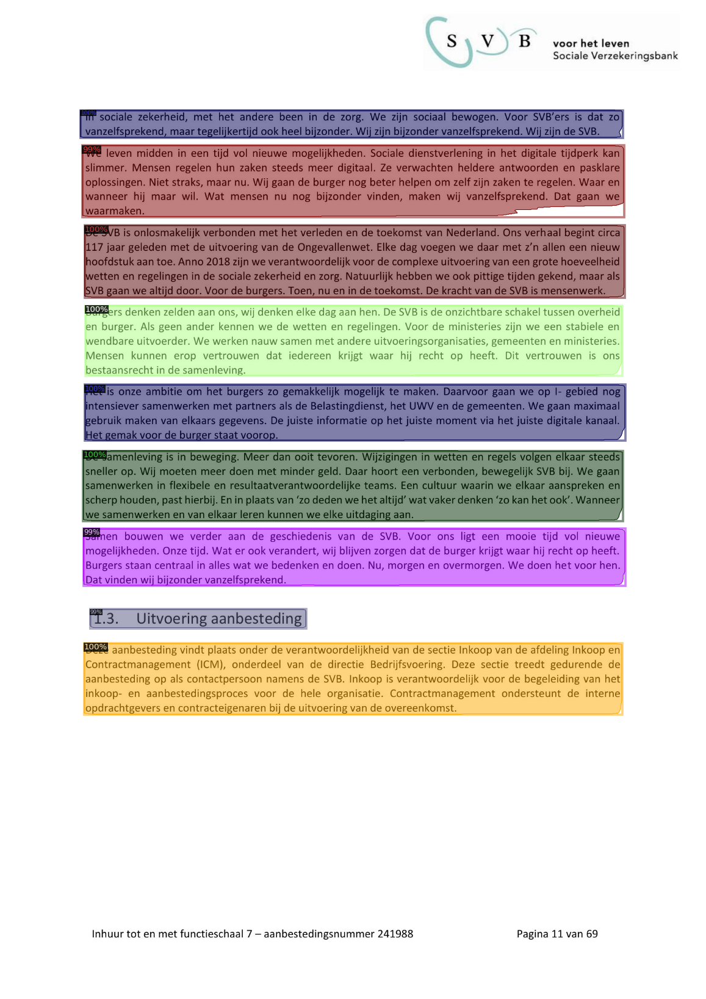

In [ ]:
# Make a prediction with the custom model
make_inference("/content/drive/My Drive/manpower_dataset/outputim/15444bab-2399-4ea5-ba8b-af87edf0a9ec-11.jpg",
               model_config="/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml",
               model_weights="/content/drive/My Drive/model/model_200iterations.pth",
               n=10)

WARNING [07/20 10:34:01 d2.config.compat]: Config '/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml' has no VERSION. Assuming it to be compatible with latest v2.


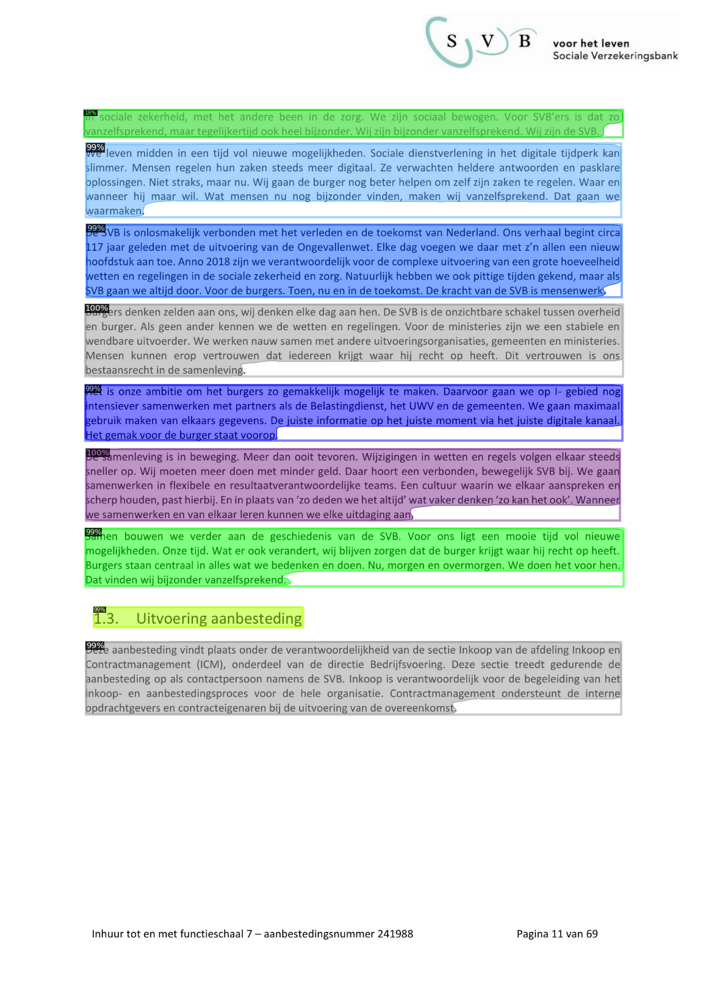

In [ ]:
# Make a prediction with the old model
make_inference("/content/drive/My Drive/manpower_dataset/outputim/15444bab-2399-4ea5-ba8b-af87edf0a9ec-11.jpg",
               model_config="/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml",
               model_weights="/content/model_final_trimmed.pth?dl=0",
               n=10)

# COCO evaluator


In [ ]:
#model before training evaluation
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

# Setup a model config (recipe for training a Detectron2 model)
cfg=get_cfg()

# Add some basic instructions for the Detectron2 model from the model_zoo: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md
cfg.merge_from_file("/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml")

# Add some pretrained model weights from an object detection model
cfg.MODEL.WEIGHTS = "/content/model_final_trimmed.pth?dl=0"

# Setup datasets to train/validate on (this will only work if the datasets are registered with DatasetCatalog)
cfg.DATASETS.TRAIN = ("my_dataset_train2",) #("/content/Seagreen_train",)
cfg.DATASETS.TEST = ("my_dataset_test2",) #("/content/Seagreen_test",)

# How many dataloaders to use? This is the number of CPUs to load the data into Detectron2, Colab has 2, so we'll use 2
cfg.DATALOADER.NUM_WORKERS = 2

# How many images per batch? The original models were trained on 8 GPUs with 16 images per batch, since we have 1 GPU: 16/8 = 2.
cfg.SOLVER.IMS_PER_BATCH = 2

# We do the same calculation with the learning rate as the GPUs, the original model used 0.01, so we'll divide by 8: 0.01/8 = 0.00125.
cfg.SOLVER.BASE_LR = 0.00125

# How many iterations are we going for? (300 is okay for our small model, increase for larger datasets)
cfg.SOLVER.MAX_ITER = 0

# ROI = region of interest, as in, how many parts of an image are interesting, how many of these are we going to find? 
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128

# We're only dealing with 2 classes (coffeemaker and fireplace) 
cfg.MODEL.RETINANET.NUM_CLASSES = 5

# Setup output directory, all the model artefacts will get stored here in a folder called "outputs" 
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Setup the default Detectron2 trainer, see: https://detectron2.readthedocs.io/modules/engine.html#detectron2.engine.defaults.DefaultTrainer
trainer = DefaultTrainer(cfg)

trainer.resume_or_load(resume=False) 

# Start training
trainer.train()

WARNING [07/22 09:49:28 d2.config.compat]: Config '/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml' has no VERSION. Assuming it to be compatible with latest v2.
[07/22 09:49:30 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

#cfg.MODEL.WEIGHTS = "/content/model_final_trimmed.pth?dl=0"
#cfg.MODEL.WEIGHTS = "/content/output/model_final.pth"


# Setup an evaluator, we use COCO because it's one of the standards for object detection: https://detectron2.readthedocs.io/modules/evaluation.html#detectron2.evaluation.COCOEvaluator
evaluator = COCOEvaluator(dataset_name="my_dataset_test2", 
                          cfg=cfg, 
                          distributed=False, # use multiple GPUs? we're in Colab so we only use one
                          output_dir="./output/")

# Create a dataloader to load in the test data (cmaker-fireplace-valid)
val_loader = build_detection_test_loader(cfg, 
                                         dataset_name="my_dataset_test2")

# Make inference on the validation dataset: https://detectron2.readthedocs.io/tutorials/evaluation.html
inference_on_dataset(model=trainer.model, # get the model from the trainer
                     data_loader=val_loader, 
                     evaluator=evaluator)

WARNING [07/22 09:49:38 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/22 09:49:38 d2.data.datasets.coco]: Loaded 38 images in COCO format from /content/drive/My Drive/manpower_dataset/test.json
[07/22 09:49:38 d2.data.common]: Serializing 38 elements to byte tensors and concatenating them all ...
[07/22 09:49:38 d2.data.common]: Serialized dataset takes 0.05 MiB
[07/22 09:49:38 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[07/22 09:49:38 d2.evaluation.evaluator]: Start inference on 38 images
[07/22 09:49:52 d2.evaluation.evaluator]: Inference done 11/38. 0.7956 s / img. ETA=0:00:29
[07/22 09:49:57 d2.evaluation.evaluator]: Inference done 16/38. 0.7860 s / img. ETA=0:00:23
[07/22 09:50:02 d2.evaluation.evaluator]: Inference done 21/38. 0.7856 s / img. ETA=0:00:18
[07/22 09:50:08 d2.evaluation.evaluator]: Inference do

OrderedDict([('bbox',
              {'AP': 36.636125897181934,
               'AP-figure': nan,
               'AP-list': 0.0,
               'AP-table': 39.630641635592134,
               'AP-text': 60.177399880118145,
               'AP-title': 46.736462073017485,
               'AP50': 49.30757482747766,
               'AP75': 42.590077119095696,
               'APl': 36.39662044501902,
               'APm': 54.0412829242134,
               'APs': nan}),
             ('segm',
              {'AP': 32.66927424091466,
               'AP-figure': nan,
               'AP-list': 0.018001800180018002,
               'AP-table': 41.78485705713429,
               'AP-text': 41.883322006282306,
               'AP-title': 46.99091610006202,
               'AP50': 48.72124781667224,
               'AP75': 38.21921455938174,
               'APl': 32.21523597328766,
               'APm': 56.186316462205575,
               'APs': nan})])

In [ ]:
#model after training evaluation
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

# Setup a model config (recipe for training a Detectron2 model)
cfg=get_cfg()

# Add some basic instructions for the Detectron2 model from the model_zoo: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md
cfg.merge_from_file("/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml")

# Add some pretrained model weights from an object detection model
cfg.MODEL.WEIGHTS = "/content/drive/My Drive/model/model_200iterations.pth"

# Setup datasets to train/validate on (this will only work if the datasets are registered with DatasetCatalog)
cfg.DATASETS.TRAIN = ("my_dataset_train2",) #("/content/Seagreen_train",)
cfg.DATASETS.TEST = ("my_dataset_test2",) #("/content/Seagreen_test",)

# How many dataloaders to use? This is the number of CPUs to load the data into Detectron2, Colab has 2, so we'll use 2
cfg.DATALOADER.NUM_WORKERS = 2

# How many images per batch? The original models were trained on 8 GPUs with 16 images per batch, since we have 1 GPU: 16/8 = 2.
cfg.SOLVER.IMS_PER_BATCH = 2

# We do the same calculation with the learning rate as the GPUs, the original model used 0.01, so we'll divide by 8: 0.01/8 = 0.00125.
cfg.SOLVER.BASE_LR = 0.00125

# How many iterations are we going for? (300 is okay for our small model, increase for larger datasets)
cfg.SOLVER.MAX_ITER = 0

# ROI = region of interest, as in, how many parts of an image are interesting, how many of these are we going to find? 
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128

# We're only dealing with 2 classes (coffeemaker and fireplace) 
cfg.MODEL.RETINANET.NUM_CLASSES = 5

# Setup output directory, all the model artefacts will get stored here in a folder called "outputs" 
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Setup the default Detectron2 trainer, see: https://detectron2.readthedocs.io/modules/engine.html#detectron2.engine.defaults.DefaultTrainer
trainer = DefaultTrainer(cfg)

trainer.resume_or_load(resume=False) 

# Start training
trainer.train()

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

#cfg.MODEL.WEIGHTS = "/content/model_final_trimmed.pth?dl=0"
#cfg.MODEL.WEIGHTS = "/content/output/model_final.pth"


# Setup an evaluator, we use COCO because it's one of the standards for object detection: https://detectron2.readthedocs.io/modules/evaluation.html#detectron2.evaluation.COCOEvaluator
evaluator = COCOEvaluator(dataset_name="my_dataset_test2", 
                          cfg=cfg, 
                          distributed=False, # use multiple GPUs? we're in Colab so we only use one
                          output_dir="./output/")

# Create a dataloader to load in the test data (cmaker-fireplace-valid)
val_loader = build_detection_test_loader(cfg, 
                                         dataset_name="my_dataset_test2")

# Make inference on the validation dataset: https://detectron2.readthedocs.io/tutorials/evaluation.html
inference_on_dataset(model=trainer.model, # get the model from the trainer
                     data_loader=val_loader, 
                     evaluator=evaluator)

WARNING [07/22 09:35:31 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/22 09:35:31 d2.data.datasets.coco]: Loaded 38 images in COCO format from /content/drive/My Drive/manpower_dataset/test.json
[07/22 09:35:31 d2.data.common]: Serializing 38 elements to byte tensors and concatenating them all ...
[07/22 09:35:31 d2.data.common]: Serialized dataset takes 0.05 MiB
[07/22 09:35:31 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[07/22 09:35:31 d2.evaluation.evaluator]: Start inference on 38 images
[07/22 09:35:43 d2.evaluation.evaluator]: Inference done 11/38. 0.7773 s / img. ETA=0:00:27
[07/22 09:35:48 d2.evaluation.evaluator]: Inference done 16/38. 0.7760 s / img. ETA=0:00:22
[07/22 09:35:54 d2.evaluation.evaluator]: Inference done 22/38. 0.7749 s / img. ETA=0:00:16
[07/22 09:36:00 d2.evaluation.evaluator]: Inference do

OrderedDict([('bbox',
              {'AP': 66.61259552537754,
               'AP-figure': nan,
               'AP-list': 57.711831273502526,
               'AP-table': 69.07406454931207,
               'AP-text': 76.6824009943751,
               'AP-title': 62.98208528432051,
               'AP50': 80.45454956840267,
               'AP75': 73.1904309938522,
               'APl': 66.22650587079205,
               'APm': 69.54905571445045,
               'APs': nan}),
             ('segm',
              {'AP': 66.52446227810039,
               'AP-figure': nan,
               'AP-list': 58.32377202602147,
               'AP-table': 69.07406454931207,
               'AP-text': 75.36005821137023,
               'AP-title': 63.339954325697846,
               'AP50': 80.45454956840267,
               'AP75': 74.117623645249,
               'APl': 66.3561639849393,
               'APm': 69.25975320228534,
               'APs': nan})])

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

# Setup config
cfg = get_cfg()
cfg.merge_from_file("/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml")
cfg.MODEL.WEIGHTS = "/content/drive/My Drive/model/model_200iterations.pth"
#cfg.MODEL.SCORE_THRESH_TEST = threshold
cfg.DATASETS.TRAIN = ("my_dataset_train2",)
cfg.DATASETS.TEST = ("my_dataset_test2",)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = DefaultTrainer(cfg)


# # Make a prediction with the custom model
# make_inference("/content/drive/My Drive/manpower_dataset/outputim/15444bab-2399-4ea5-ba8b-af87edf0a9ec-11.jpg",
#                model_config="/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml",
#                model_weights="/content/drive/My Drive/model/model_200iterations.pth",
#                n=10)

WARNING [07/22 09:31:18 d2.config.compat]: Config '/content/DLA_mask_rcnn_X_101_32x8d_FPN_3x.yaml' has no VERSION. Assuming it to be compatible with latest v2.
[07/22 09:31:20 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

#cfg.MODEL.WEIGHTS = "/content/model_final_trimmed.pth?dl=0"
#cfg.MODEL.WEIGHTS = "/content/output/model_final.pth"


# Setup an evaluator, we use COCO because it's one of the standards for object detection: https://detectron2.readthedocs.io/modules/evaluation.html#detectron2.evaluation.COCOEvaluator
evaluator = COCOEvaluator(dataset_name="my_dataset_test2", 
                          cfg=cfg, 
                          distributed=False, # use multiple GPUs? we're in Colab so we only use one
                          output_dir="./output/")

# Create a dataloader to load in the test data (cmaker-fireplace-valid)
val_loader = build_detection_test_loader(cfg, 
                                         dataset_name="my_dataset_test2")

# Make inference on the validation dataset: https://detectron2.readthedocs.io/tutorials/evaluation.html
inference_on_dataset(model=trainer.model, # get the model from the trainer
                     data_loader=val_loader, 
                     evaluator=evaluator)

WARNING [07/22 09:31:37 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/22 09:31:37 d2.data.datasets.coco]: Loaded 38 images in COCO format from /content/drive/My Drive/manpower_dataset/test.json
[07/22 09:31:37 d2.data.common]: Serializing 38 elements to byte tensors and concatenating them all ...
[07/22 09:31:37 d2.data.common]: Serialized dataset takes 0.05 MiB
[07/22 09:31:37 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[07/22 09:31:37 d2.evaluation.evaluator]: Start inference on 38 images
[07/22 09:32:08 d2.evaluation.evaluator]: Inference done 11/38. 0.9654 s / img. ETA=0:00:54
[07/22 09:32:14 d2.evaluation.evaluator]: Inference done 14/38. 0.9646 s / img. ETA=0:00:49
[07/22 09:32:20 d2.evaluation.evaluator]: Inference done 17/38. 0.9659 s / img. ETA=0:00:43
[07/22 09:32:26 d2.evaluation.evaluator]: Inference do

OrderedDict([('bbox',
              {'AP': 0.0,
               'AP-figure': nan,
               'AP-list': 0.0,
               'AP-table': 0.0,
               'AP-text': 0.0,
               'AP-title': 0.0,
               'AP50': 0.0,
               'AP75': 0.0,
               'APl': 0.0,
               'APm': 0.0,
               'APs': nan}),
             ('segm',
              {'AP': 0.0,
               'AP-figure': nan,
               'AP-list': 0.0,
               'AP-table': 0.0,
               'AP-text': 0.0,
               'AP-title': 0.0,
               'AP50': 0.0,
               'AP75': 0.0,
               'APl': 0.0,
               'APm': 0.0,
               'APs': nan})])

# training airbnb


In [ ]:
# Training bounding boxes (1.11G)
!wget https://storage.googleapis.com/openimages/2018_04/train/train-annotations-bbox.csv

# Validating bounding boxes (23.94M)
!wget https://storage.googleapis.com/openimages/v5/validation-annotations-bbox.csv
    
# Testing bounding boxes (73.89M)
!wget https://storage.googleapis.com/openimages/v5/test-annotations-bbox.csv

# Class names of images (11.73K)
!wget https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv

--2020-04-29 22:41:03--  https://storage.googleapis.com/openimages/2018_04/train/train-annotations-bbox.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.20.128, 2607:f8b0:400e:c09::80
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.20.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1194033454 (1.1G) [text/csv]
Saving to: ‘train-annotations-bbox.csv’

train-annotations-b 100%[===================>]   1.11G   120MB/s    in 10s     

2020-04-29 22:41:14 (112 MB/s) - ‘train-annotations-bbox.csv’ saved [1194033454/1194033454]

--2020-04-29 22:41:15--  https://storage.googleapis.com/openimages/v5/validation-annotations-bbox.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.20.128, 2607:f8b0:400e:c07::80
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.20.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 25105048 (24M) [text/csv]
Saving to: ‘validation

Wonderful, now we've got the label files, we can download some images.

We'll see how these two (labels and images) go together shortly.

To download the images, I started with a script [based on one I found in an online tutorial from LearnOpenCV](https://www.learnopencv.com/fast-image-downloader-for-open-images-v4/).

However, after using it, I found a few things weren't needed so I modified it to [my own version](https://github.com/mrdbourke/airbnb-amenity-detection/blob/master/downloadOI.py).

To save download time, I've stored the images from two classes (fireplace & coffeemaker) in a Google Storage Bucket, so we'll download them from there.

But if you want an example of how to download them yourself using the [downloadOI.py](https://github.com/mrdbourke/airbnb-amenity-detection/blob/master/downloadOI.py) script, see the commented lines in the cell below. 

In [ ]:
# Get coffeemaker and fireplace training images from Open Images and unzip them
!wget https://storage.googleapis.com/airbnb-amenity-detection-storage/airbnb-amenity-detection/open-images-data/cmaker-fireplace-train.zip
!unzip -q cmaker-fireplace-train # q is for quiet (nothing gets printed out, the unzip happens in the background)

# Get coffeemaker and fireplace validation images from Open Images and unzip them
!wget https://storage.googleapis.com/airbnb-amenity-detection-storage/airbnb-amenity-detection/open-images-data/cmaker-fireplace-valid.zip
!unzip -q cmaker-fireplace-valid

# # If you wanted to download the above two datasets yourself, you could do so by uncommenting the lines below
# !git clone https://github.com/mrdbourke/airbnb-amenity-detection.git
# # Notice the lack of spaces between the class names
# !python3 airbnb-amenity-detection/downloadOI.py --classes 'Coffeemaker,Fireplace' --dataset train
# !python3 airbnb-amenity-detection/downloadOI.py --classes 'Coffeemaker,Fireplace' --dataset validation

--2020-04-29 22:41:20--  https://storage.googleapis.com/airbnb-amenity-detection-storage/airbnb-amenity-detection/open-images-data/cmaker-fireplace-train.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.142.128, 2607:f8b0:400e:c07::80
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.142.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 247479981 (236M) [application/zip]
Saving to: ‘cmaker-fireplace-train.zip’

cmaker-fireplace-tr 100%[===================>] 236.01M   126MB/s    in 1.9s    

2020-04-29 22:41:22 (126 MB/s) - ‘cmaker-fireplace-train.zip’ saved [247479981/247479981]

--2020-04-29 22:41:26--  https://storage.googleapis.com/airbnb-amenity-detection-storage/airbnb-amenity-detection/open-images-data/cmaker-fireplace-valid.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.142.128, 2607:f8b0:400e:c09::80
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.142.128|:443... 

Now we've got some images, let's look at one. If everything worked, the cell below should display an image of a coffeemaker or fireplace from the Open Images dataset.

First we'll setup the training and validation paths for ease of use later.

In [ ]:
# Setup the paths for the training and validation data
train_path = "./cmaker-fireplace-train/"
valid_path = "./cmaker-fireplace-valid/"

Let's look at an example image from the training set.

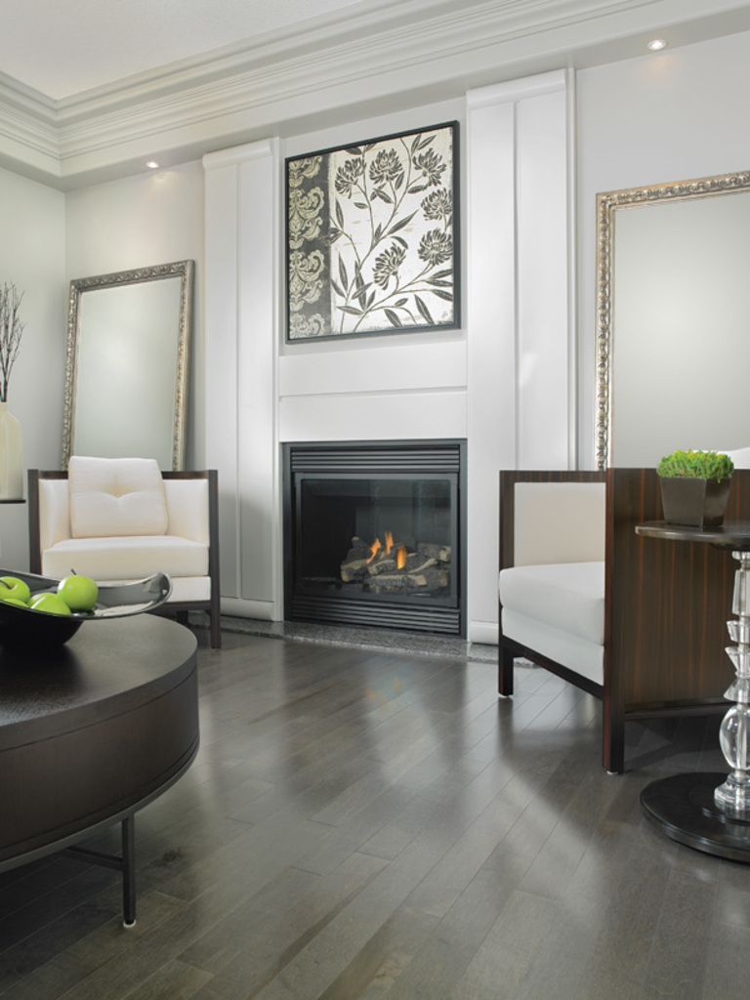

In [ ]:
import os
# Read in a random image from the training directory
train_img = cv2.imread(train_path + random.sample(os.listdir("./cmaker-fireplace-train"), 1)[0])
cv2_imshow(train_img)

Did you get a fireplace or a coffeemaker? (there may be more than one amenity in the image but these are the two we're focused on)

You might be able to tell straight away but how do we tell tell a machine learning model what its looking at?

Well...

Remember the label files we downloaded earlier? 

Now's the time to combine them with the images we downloaded.

Once we've combined the label files with the image files, we'll be able to pass them both a Detectron2 model.


# preprocess data


## Combine images with labels (preprocess data)

We have to get our images and labels into [Detectron2 input style](https://detectron2.readthedocs.io/tutorials/datasets.html). This means, getting them into a list of dictionaries.

Let's take a look at an example.

```
# Example of a Detectron2 label for image "1e2c50b991a82ee8.jpg"
[{'annotations': [{'bbox': [228.0, 12.0, 791.0, 858.0],
                   'bbox_mode': <BoxMode.XYXY_ABS: 0>,
                   'category_id': 0}],
  'file_name': './cmaker-fireplace-valid/1e2c50b991a82ee8.jpg', # this will change depending on where your images are stored
  'height': 867,
  'image_id': 33,
  'width': 1024}]
```
Every image in your dataset set will have one of these. Let's break it down.
* `annotations` (list): all of the annotations (labels) on an image, a single image may have more than one of these. For object detection (our use case), it contains:
  * `bbox` (list of int): the coordinates in pixel values of a bounding box.
  * `bbox_mode` ([Enum](https://docs.python.org/3/library/enum.html)): the order and scale of the pixel values in `bbox`, [see more in the docs](https://detectron2.readthedocs.io/modules/structures.html#detectron2.structures.BoxMode).
  * `category_id` (int): the numerical mapping of the category of the object inside `bbox`, example `{coffeemaker:0, fireplace:1}`.
* `file_name` (str): string filepath to target image.
* `height` (int): height of target image.
* `width` (int): width of target image.
* `image_id` (int): unique image identifier, used during evaluation to identify images.

In the case of object detection with Detectron2, these are the bare minimum pieces of information required for each image.

**Note:** There are more options for creating your own dataset annotations, such as pixel coordinates for segmantic masks. These can be found in the [Detectron2 datasets tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html). 

With the format of the labels required for Detectron2 known, let's start to write some functions to turn the label files we downloaded before into Detectron2 labels.

First, we'll define the two target classes we're working with (fireplace & coffeemaker).

In [ ]:
# Define the two target classes we're working with (tidbit: in my experience, I found having them in alphabetical order helps prevent confusion later on)
subset_classes = ["Coffeemaker", "Fireplace"]

Beautiful. When it comes to data preprocessing it's important to start small.

We're going to be building a series of helper functions which help turn our label CSV files into a list of dictionaries ready for Detectron2.

First is `get_image_ids()`. In a sentence, it takes a image folder filepath, finds all the images in the filepath and collects their unique IDs in a list.


In [ ]:
def get_image_ids(image_folder=None):
    """
    Explores a folder of images and gets their ID from their file name.
    Returns a list of all image ID's in image_folder.
    E.g. image_folder/608fda8c976e0ac.jpg -> ["608fda8c976e0ac"]
    
    Params
    ------
    image_folder (str): path to folder of images, e.g. "../validation/"
    """
    return [os.path.splitext(img_name)[0] for img_name in os.listdir(image_folder) if img_name.endswith(".jpg")]

Let's see an example.

In [ ]:
# Find the image IDs in the validation images folder
val_img_ids = get_image_ids(valid_path)

# Return the first 5 validation image IDs
val_img_ids[:5]

['2540d6d0d881c2ba',
 '3de4aee2b4120b7f',
 '288150fcf6fcac88',
 '8cb74f2517f0a7ae',
 'd416162446907a10']

Excellent. We're on the way to creating the `file_name` portion of our label annotation.

**Note:** We can use `get_image_ids()` in this fashion because when you download images from Open Images, their filenames are all unique (e.g. `608fda8c976e0ac.jpg`). It's important to remember, data preprocessing steps will depend on how your data begins with and needs to end up.

Next, let's create `format_annotations()`.

In a sentence, it takes an existing annotations file downloaded from Open Images, such as, [`validation-annotations-bbox.csv`](https://storage.googleapis.com/openimages/v5/validation-annotations-bbox.csv), adds some useful information and removes unneeded rows (images we're not focused on).

The removal of rows is important since downloading the annotation files from Open Images downloads the annotations for *every* image in that specific set (up to 1.9 million images for the training set).

First, let's view what an unformatted annotation file looks like. Details on what each of the columns mean can be seen on the [Open Images data download page](https://storage.googleapis.com/openimages/web/download.html) (be sure to scroll down).

In [ ]:
# View unformatted annotations (as downloaded from Open Images)
val_annots = pd.read_csv("validation-annotations-bbox.csv")
val_annots.head()

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside
0,0001eeaf4aed83f9,xclick,/m/0cmf2,1,0.022673,0.964200,0.071038,0.800546,0,0,0,0,0
1,000595fe6fee6369,xclick,/m/02wbm,1,0.000000,1.000000,0.000000,1.000000,0,0,1,0,0
2,000595fe6fee6369,xclick,/m/02xwb,1,0.141384,0.179676,0.676275,0.731707,0,0,0,0,0
3,000595fe6fee6369,xclick,/m/02xwb,1,0.213549,0.253314,0.299335,0.354767,1,0,0,0,0
4,000595fe6fee6369,xclick,/m/02xwb,1,0.232695,0.288660,0.490022,0.545455,1,0,0,0,0


Notice how the `LabelName` shows values like `/m/0cmf2`? 

Confusing, right?

That's something we'll be changing with the help of [`class-descriptions-boxable.csv`](https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv). 

Let's see how we might create a function to format the annotations, then we'll see it in action.

In [ ]:
# Make a function which formats a specific annotations csv based on what we're dealing with
def format_annotations(image_folder, annotation_file, target_classes=None):
    """
    Formats annotation_file based on images contained in image_folder.
    Will get all unique image IDs and make sure annotation_file
    only contains those (the target images).
    Adds meta-data to annotation_file such as class names and categories.
    If target_classes isn't None, the returned annotations will be filtered by this list.
    Note: image_folder and annotation_file should both be validation if working on
    validation set or both be training if working on training set.
    
    Params
    ------
    image_folder (str): path to folder of target images.
    annotation_file (str): path to annotation file of target images.
    target_classes (list), optional: a list of target classes you'd like to filter labels.
    """
    # Get all image ids from target directory
    image_ids = get_image_ids(image_folder)
    
    # Setup annotation file and classnames
    annot_file = pd.read_csv(annotation_file)
    classes = pd.read_csv("class-descriptions-boxable.csv",
                          names=["LabelName", "ClassName"])
    
    # Create classname column on annotations which converts label codes to string labels
    annot_file["ClassName"] = annot_file["LabelName"].map(classes.set_index("LabelName")["ClassName"])

    # Sort annot_file by "ClassName" for alphabetical labels (used with target_classes)
    annot_file.sort_values(by=["ClassName"], inplace=True)
    
    # Make sure we only get the images we're concerned about
    if target_classes:
        annot_file = annot_file[annot_file["ImageID"].isin(image_ids) & annot_file["ClassName"].isin(target_classes)]
    else:
        annot_file = annot_file[annot_file["ImageID"].isin(image_ids)]
    
    assert len(annot_file.ImageID.unique()) == len(image_ids), "Label unique ImageIDs doesn't match target folder."
   
    # Add ClassID column, e.g. "Bathtub, Toilet" -> 1, 2
    annot_file["ClassName"] = pd.Categorical(annot_file["ClassName"])
    annot_file["ClassID"] = annot_file["ClassName"].cat.codes
    
    return annot_file

In [ ]:
# Test our annotation formatting function
val_annots_formatted = format_annotations(image_folder=valid_path,
                                          annotation_file="validation-annotations-bbox.csv",
                                          target_classes=subset_classes) # (fireplace & coffeemaker)

val_annots_formatted.head()

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside,ClassName,ClassID
203163,aa9b35d1bee25627,xclick,/m/07xyvk,1,0.180505,0.781588,0.009025,1.000000,0,0,0,0,0,Coffeemaker,0
226829,be4baa5e56b3067a,xclick,/m/07xyvk,1,0.122744,0.873646,0.032491,0.967509,0,1,0,0,0,Coffeemaker,0
209385,af8bb7fe53a45294,xclick,/m/07xyvk,1,0.000000,0.846875,0.000000,1.000000,0,1,0,0,0,Coffeemaker,0
28421,182c1f2bfa4b4280,xclick,/m/07xyvk,1,0.016667,1.000000,0.000000,1.000000,0,0,0,0,0,Coffeemaker,0
177833,9685d11149d6eb2e,xclick,/m/07xyvk,1,0.353562,0.989446,0.014085,0.963028,0,0,0,0,0,Coffeemaker,0


That looks better. Notice the addition of the `ClassName` column on the right and the `ClassID` column which is an integer representing each unique class.

In this case, `Coffeemaker = 0` and `Fireplace = 1`.

In [ ]:
# See different integer identifiers of our target classes
val_annots_formatted[["ClassName", "ClassID"]]

,ClassName,ClassID
203163,Coffeemaker,0
226829,Coffeemaker,0
209385,Coffeemaker,0
28421,Coffeemaker,0
177833,Coffeemaker,0
...,...,...
238843,Fireplace,1
213781,Fireplace,1
255885,Fireplace,1
56020,Fireplace,1


The `ClassID` will be the `category_id` portion of our label dictionary.

Finally, the `format_annotations()` function also removed all of the rows of the annotations which didn't relate to our target images.

In [ ]:
# Check the lengths of formatted and unformatted validation annotations
len(val_annots), len(val_annots_formatted)

(303980, 62)

We're getting closer.

The next parameters we're going to take care of our custom image labels are `bbox` and `bbox_mode`.

`bbox` is a list of integers containing the coordinates of the corners of a bounding box around a target object.

`bbox_mode` is a Detectron2 specific structure which tells Detectron2 the format `bbox` comes in. For example, `BoxMode.XYXY_ABS` means, the values in `bbox` will come in the form of `[x0, y0, x1, y0]`, where:
* `x0`, `y0` = bottom left corner of box
* `x1`, `y1` = top right corner of box
* `ABS` = each pixel is in its absolute value 

Let's take a look at an example of what our bounding box coordinates currently look like.

In [ ]:
# Example of relative pixel values
val_annots[["XMin", "XMax", "YMin", "YMax"]].head()

,XMin,XMax,YMin,YMax
0,0.022673,0.964200,0.071038,0.800546
1,0.000000,1.000000,0.000000,1.000000
2,0.141384,0.179676,0.676275,0.731707
3,0.213549,0.253314,0.299335,0.354767
4,0.232695,0.288660,0.490022,0.545455


Our current bounding box labels are in relative format. Meaning if we take `XMin` and multiply it by the width of an image, we'll get its absolute value.

You might also notice the order of our current bounding box coordinates is different to `BoxMode.XYXY_ABS` (`[x0, x1, y0, y1]` vs. `[x0, y0, x1, y1]`).

Let's write `rel_to_absolute()` to convert our current bounding box coordinates from relative to absolute.

In [ ]:
def rel_to_absolute(bbox, height, width):
    """
    Converts bounding box dimensions from relative to absolute pixel values (Detectron2 style).
    See: https://detectron2.readthedocs.io/modules/structures.html#detectron2.structures.BoxMode
    
    Params
    ------
    bbox (array): relative dimensions of bounding box in format (x0, y0, x1, y1 or Xmin, Ymin, Xmax, Ymax)
    height (int): height of image
    width (int): width of image
    """
    bbox[0] = np.round(np.multiply(bbox[0], width)) # x0
    bbox[1] = np.round(np.multiply(bbox[1], height)) # y0
    bbox[2] = np.round(np.multiply(bbox[2], width)) # x1
    bbox[3] = np.round(np.multiply(bbox[3], height)) # y1
    return [i.astype("object") for i in bbox] # convert all to objects for JSON saving

Great, now let's try it out for a sample.

In [ ]:
# Sample row we're going to convert
val_annots_formatted.head(1)

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside,ClassName,ClassID
203163,aa9b35d1bee25627,xclick,/m/07xyvk,1,0.180505,0.781588,0.009025,1.0,0,0,0,0,0,Coffeemaker,0


In [ ]:
# Get sample image height and width
height, width = cv2.imread(valid_path+val_annots_formatted.loc[203163]["ImageID"]+".jpg").shape[:2]

# Get array of bounding box for sample image
relative_bbox = val_annots_formatted.loc[203163][["XMin", "XMax", "YMin", "YMax"]].values
print(f"Relative bbox: {relative_bbox}")

# Convert sample image bounding box coordinates
absolute_bbox = rel_to_absolute(relative_bbox, height, width)
print(f"Absolute bbox: {absolute_bbox}")

Relative bbox: [0.18050541 0.78158844 0.009025271 1.0]
Absolute bbox: [185.0, 800.0, 9.0, 1024.0]


Nice! Now we've got `bbox` and `bbox_mode` taken care of. Let's put these preprecoessing functions together in a function called `get_image_dicts()`.

In a sentence, `get_image_dicts()` takes an image folder, an annotation file (label file) which goes along with it and a list of target classes and combines them with our other functions to create Detectron2 style labels (a list of dictionaries).

Since preprocessing labels can take a while (depending on how many you have), we'll also save the created list of dictionaries to a JSON file we can load in later (we'll see this when we register a dataset with Detectron2).

In [ ]:
from detectron2.structures import BoxMode
import json
import pprint

def get_image_dicts(image_folder, annotation_file, target_classes=None):
    """
    Create Dectectron2 style labels in the form of a list of dictionaries.
    
    Params
    ------
    image_folder (str): target folder containing images
    annotations (DataFrame): DataFrame of image label data
    target_classes (list): names of target Open Images classes

    Note: image_folder and annotation_file should both relate to the same dataset (this could be improved).
    E.g.
    image_folder = valid_images & annotation_file = valid_annotations (both are for the validation set)
    """
    # Get name of dataset from image_folder 
    dataset_name = str(image_folder)

    # Create dataset specific annotations.
    annotations = format_annotations(image_folder=image_folder, 
                                     annotation_file=annotation_file,
                                     target_classes=target_classes)

    # Get all unique image ids from target folder
    img_ids = get_image_ids(image_folder)

    # Add some verbosity 
    print(f"\nUsing {annotation_file} for annotations...")
    print(f"On dataset: {dataset_name}")
    print("Classes we're using:\n{}".format(annotations["ClassName"].value_counts()))
    print(f"Total number of images: {len(img_ids)}")
    
    # Start creating image dictionaries (Detectron2 style labelling)
    img_dicts = []
    for idx, img in tqdm(enumerate(img_ids)):
        record = {}
        
        # Get image metadata
        file_name = image_folder + img + ".jpg"
        height, width = cv2.imread(file_name).shape[:2]
        img_data = annotations[annotations["ImageID"] == img].reset_index() # reset_index(): important for images
                                                                            # with multiple objects
        # Verbosity for image label troubleshooting
        # print(f"On image: {img}")
        # print(f"Image category: {img_data.ClassID.values}")
        # print(f"Image label: {img_data.ClassName.values}")

        # Update record dictionary
        record["file_name"] = file_name
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width
        
        # Create list of image annotations (labels)
        img_annotations = []
        for i in range(len(img_data)): # this is where we loop through examples with multiple objects in an image
            category_id = img_data.loc[i]["ClassID"].astype("object") # JSON (for evalution) can't take int8 (NumPy type) must be native Python type
            # Get bounding box coordinates in Detectron2 style (x0, y0, x1, y1)
            bbox = np.float32(img_data.loc[i][["XMin", "YMin", "XMax", "YMax"]].values)
            # Convert bbox from relative to absolute pixel dimensions
            bbox = rel_to_absolute(bbox=bbox, height=height, width=width)
            # Setup annot (1 annot = 1 label, there might be more) dictionary
            annot = {
                "bbox": bbox, 
                "bbox_mode": BoxMode.XYXY_ABS, # See: https://detectron2.readthedocs.io/modules/structures.html#detectron2.structures.BoxMode.XYXY_ABS
                "category_id": category_id
            }
            img_annotations.append(annot)
            
        # Update record dictionary with annotations
        record["annotations"] = img_annotations
        
        # Add record dictionary with image annotations to img_dicts list
        img_dicts.append(record)

    # Save img_dicts to JSON for use later
    prefix = "valid" if "valid" in image_folder else "train"
    json_file = os.path.join(image_folder, prefix + "_labels.json")
    print(f"\nSaving labels to: {json_file}...")
    with open(json_file, "w") as f:
      json.dump(img_dicts, f)

    print("Showing an example:")
    pprint.pprint(random.sample(img_dicts, 1))

    # return img labels dictionary
    return img_dicts

Woah, that's a pretty big function, but when you break it down, it's bringing together the previous functions we created (`get_image_ids`, `format_annotations`, `rel_to_absolute`).

Let's try it out.

In [ ]:
# Create list of validation image dictionaries
%%time
val_img_dicts = get_image_dicts(image_folder=valid_path,
                                annotation_file="validation-annotations-bbox.csv",
                                target_classes=subset_classes)

6it [00:00, 58.16it/s]


Using validation-annotations-bbox.csv for annotations...
On dataset: ./cmaker-fireplace-valid/
Classes we're using:
Fireplace      41
Coffeemaker    21
Name: ClassName, dtype: int64
Total number of images: 61


61it [00:00, 65.16it/s]


Saving labels to: ./cmaker-fireplace-valid/valid_labels.json...
Showing an example:
[{'annotations': [{'bbox': [219.0, 109.0, 566.0, 521.0],
                   'bbox_mode': <BoxMode.XYXY_ABS: 0>,
                   'category_id': 1}],
  'file_name': './cmaker-fireplace-valid/d96609dcb5d94621.jpg',
  'height': 666,
  'image_id': 26,
  'width': 1024}]
CPU times: user 1.49 s, sys: 22.7 ms, total: 1.51 s
Wall time: 1.53 s


In [ ]:
# Create list of training image dictionaries
%%time
train_img_dicts = get_image_dicts(image_folder=train_path,
                                  annotation_file="train-annotations-bbox.csv",
                                  target_classes=subset_classes)

8it [00:00, 73.77it/s]


Using train-annotations-bbox.csv for annotations...
On dataset: ./cmaker-fireplace-train/
Classes we're using:
Fireplace      711
Coffeemaker    323
Name: ClassName, dtype: int64
Total number of images: 918


918it [00:13, 66.36it/s]


Saving labels to: ./cmaker-fireplace-train/train_labels.json...
Showing an example:
[{'annotations': [{'bbox': [337.0, 431.0, 476.0, 588.0],
                   'bbox_mode': <BoxMode.XYXY_ABS: 0>,
                   'category_id': 1}],
  'file_name': './cmaker-fireplace-train/793db3434cdf73e9.jpg',
  'height': 682,
  'image_id': 82,
  'width': 1024}]
CPU times: user 44.3 s, sys: 3.28 s, total: 47.6 s
Wall time: 47.6 s


The training image labels took a while to create, since loading in `train-annotations-bbox.csv` takes a little while. An extension would be to improve this.

Good news is, once we run the function, the image labels get stored in the respective target image folders under the name `[IMAGE_FOLDER]_labels.json`.

Let's write a function, `load_json_labels()`, which takes a target image folder and loads in the JSON label file of image dictionaries we created with `get_image_dicts()` (we'll also need this when we register a dataset with Detectron2).

In [ ]:
def load_json_labels(image_folder):
    """
    Returns Detectron2 style labels of images (list of dictionaries) in image_folder based on JSON label file in image_folder.

    Note: Requires JSON label to be in image_folder. See get_image_dicts(). 
    
    Params
    ------
    image_folder (str): target folder containing images
    """
    # Get absolute path of JSON label file
    for file in os.listdir(image_folder):
      if file.endswith(".json"):
        json_file = os.path.join(image_folder, file)

    # Check to see if json_file exists 
    assert json_file, "No .json label file found, please make one with get_image_dicts()"

    with open(json_file, "r") as f:
      img_dicts = json.load(f)

    # Convert bbox_mode to Enum of BoxMode.XYXY_ABS (doesn't work loading normal from JSON)
    for img_dict in img_dicts:
      for annot in img_dict["annotations"]:
        annot["bbox_mode"] = BoxMode.XYXY_ABS

    return img_dicts

In [ ]:
# Load validation image dictionaries and view an example
loaded_val_img_dicts = load_json_labels(valid_path)
loaded_val_img_dicts[0]

{'annotations': [{'bbox': [0.0, 0.0, 760.0, 678.0],
   'bbox_mode': <BoxMode.XYXY_ABS: 0>,
   'category_id': 0}],
 'file_name': './cmaker-fireplace-valid/2540d6d0d881c2ba.jpg',
 'height': 678,
 'image_id': 0,
 'width': 1024}

In [ ]:
# Load training image dictionaries and view an example
loaded_train_img_dicts = load_json_labels(train_path)
loaded_train_img_dicts[0]

{'annotations': [{'bbox': [246.0, 341.0, 759.0, 739.0],
   'bbox_mode': <BoxMode.XYXY_ABS: 0>,
   'category_id': 1}],
 'file_name': './cmaker-fireplace-train/8debff4757fe442d.jpg',
 'height': 768,
 'image_id': 0,
 'width': 1024}

Boy, are they some great looking image labels!

**Note:** One the tricky parts reloading in image dictionaires is the special `BoxMode.XYXY_ABS` type, which is a Python Enum. Enum's don't save to JSON, so we have to reconvert it when we load it back in with `load_json_labels()`. There's probably a better way to do this so if you know one/find one, please let me know.

### Registering custom data with Detectron2

We've got our images and data ready but there's [one final step we have to do before we can use them with Detectron2](https://detectron2.readthedocs.io/tutorials/datasets.html#register-a-dataset) (register our data).

This is where our `load_json_labels()` function comes into play.

For some reason (it took me a while to figure this out), if you're registering a dataset with a preprocessing function, because you register it with a lambda, the function can only take one parameter.

Why do we need to register a dataset with Detectron2?

Now, I'm not entirely sure of this. But once you do, the registered dataset becomes semi-immutable (can't be easily changed).

This seems like a great idea to prevent dataset mismatches in the future.


In [ ]:
# Register datasets with Detectron2
from detectron2.data import DatasetCatalog, MetadataCatalog

# Loop through different datasets
for dataset in ["train", "valid"]:
  
    # Create dataset name strings
    dataset_name = "cmaker-fireplace-" + dataset
    print(f"Registering {dataset_name}")

    # Register the datasets with Detectron2's DatasetCatalog, which has space for a lambda function to preprocess it
    DatasetCatalog.register(dataset_name, lambda dataset_name=dataset_name: load_json_labels(dataset_name))

    # Create the metadata for our dataset (the main thing being the classnames we're using)
    MetadataCatalog.get(dataset_name).set(thing_classes=subset_classes)

# Setup metadata variable
cmaker_fireplace_metadata = MetadataCatalog.get("cmaker-fireplace-train")

Registering cmaker-fireplace-train
Registering cmaker-fireplace-valid


Oh yeah! Our datasets have been registered with Detectron2's DatasetCatalog under the names `cmaker-fireplace-train` and `cmaker-fireplace-valid`.

To see what other datasets are registered, uncomment the cell below.

In [ ]:
## Check the registered datasets with Detectron2
#DatasetCatalog._REGISTERED

**Note:** Chances are you might mess up registering datasets with Detectron2. If you do, it can be tricky to remove them and adjust them.

Below is an example of how you can removed already registered datasets to re-register them (by fixing and running the cell above).

In [ ]:
## Example of how to remove registered datasets (uncomment only if you need to)
# DatasetCatalog._REGISTERED.pop('cmaker-fireplace-train') # remove our training dataset
# DatasetCatalog._REGISTERED.pop('cmaker-fireplace-valid') # remove our validation dataset

### Viewing a custom image & labels

Now we've got our data labels created, let's paint them on one some of our images and make sure they look somewhat reasonable.

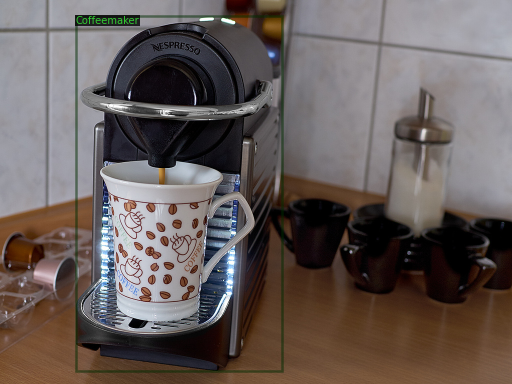

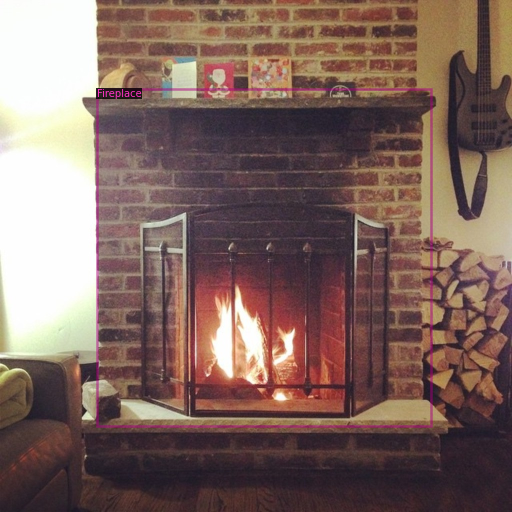

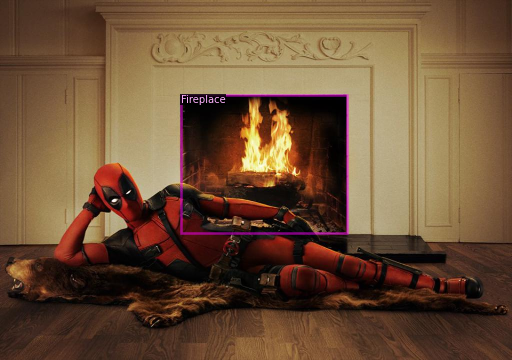

In [ ]:
for label in random.sample(train_img_dicts, 3):
    img = cv2.imread(label["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], # revervse the image pixel order (BGR -> RGB)
                            metadata=cmaker_fireplace_metadata, # use the metadata variable we created about
                            scale=0.5)
    vis = visualizer.draw_dataset_dict(label)
    cv2_imshow(vis.get_image()[:, :, ::-1])

Boom! How cool is that? Our labels worked.

Remember we said before, often, preprocessing data is one of the longer steps in a machine learning project.

But the good news is we've now got all the ingredients we need to train a custom model.

Let's do it.

## Training a custom Detectron2 model 

There are a few ways to train a Detectron2 model. Two of the main ones being using [`DefaultTrainer`](https://detectron2.readthedocs.io/modules/engine.html?highlight=defaulttrainer#detectron2.engine.defaults.DefaultTrainer) (what we're going to use) or writing your own training loop such as in [`plain_train_net.py`](https://github.com/facebookresearch/detectron2/tree/master/tools).

Which one should you use?
* `DefaultTrainer` has some common parameters setup for training and allows you to get started straight away. Use this if you're just starting with prototype or just testing out Detectron2.
* `plain_train_net.py` is an example of custom training loop. Use this if you're after maximum customizability with Detectron2 or want to incorporate an experiment tracking tool like [Weights & Biases](https://www.wandb.com/).

What you'll see below is setting up a Detectron2 `DefaultTrainer` instance as well as a config (usually under the alias `cfg`).

Some handy things to know:

* The config is the set of instructions to train the model. The beautiful thing about having this setup is you can save it, share it and use it later.
* After training is complete, a bunch of outputs such as a trained model and different model metrics will be saved to a folder called `output` (automatically created), you can change this using `cfg.OUTPUT_DIR = target_output_dir`.
* Since the [original Detectron2 models were trained on 8 GPUs](https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#introduction), for hyperparameters such as learning rate and batch size, the [linear learning rate scaling rule has been applied](https://github.com/open-mmlab/mmdetection/blob/master/docs/GETTING_STARTED.md#train-a-model).

Let's get to it!

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

# Setup a model config (recipe for training a Detectron2 model)
cfg=get_cfg()

# Add some basic instructions for the Detectron2 model from the model_zoo: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_3x.yaml"))

# Add some pretrained model weights from an object detection model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_50_FPN_3x.yaml")

# Setup datasets to train/validate on (this will only work if the datasets are registered with DatasetCatalog)
cfg.DATASETS.TRAIN = ("cmaker-fireplace-train",)
cfg.DATASETS.TEST = ("cmaker-fireplace-valid",)

# How many dataloaders to use? This is the number of CPUs to load the data into Detectron2, Colab has 2, so we'll use 2
cfg.DATALOADER.NUM_WORKERS = 2

# How many images per batch? The original models were trained on 8 GPUs with 16 images per batch, since we have 1 GPU: 16/8 = 2.
cfg.SOLVER.IMS_PER_BATCH = 2

# We do the same calculation with the learning rate as the GPUs, the original model used 0.01, so we'll divide by 8: 0.01/8 = 0.00125.
cfg.SOLVER.BASE_LR = 0.00125

# How many iterations are we going for? (300 is okay for our small model, increase for larger datasets)
cfg.SOLVER.MAX_ITER = 300

# ROI = region of interest, as in, how many parts of an image are interesting, how many of these are we going to find? 
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128

# We're only dealing with 2 classes (coffeemaker and fireplace) 
cfg.MODEL.RETINANET.NUM_CLASSES = 2

# Setup output directory, all the model artefacts will get stored here in a folder called "outputs" 
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Setup the default Detectron2 trainer, see: https://detectron2.readthedocs.io/modules/engine.html#detectron2.engine.defaults.DefaultTrainer
trainer = DefaultTrainer(cfg)

# Resume training from model checkpoint or not, we're going to just load the model in the config: https://detectron2.readthedocs.io/modules/engine.html#detectron2.engine.defaults.DefaultTrainer.resume_or_load
trainer.resume_or_load(resume=False) 

# Start training
trainer.train()

Loading config /usr/local/lib/python3.6/dist-packages/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


[04/29 22:42:21 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

model_final_4cafe0.pkl: 152MB [00:02, 54.5MB/s]                           


[04/29 22:42:30 d2.engine.train_loop]: Starting training from iteration 0
[04/29 22:42:36 d2.utils.events]:  eta: 0:01:05  iter: 19  total_loss: 1.095  loss_cls: 0.935  loss_box_reg: 0.197  time: 0.2324  data_time: 0.0277  lr: 0.000025  max_mem: 2376M
[04/29 22:42:41 d2.utils.events]:  eta: 0:01:01  iter: 39  total_loss: 1.223  loss_cls: 1.014  loss_box_reg: 0.182  time: 0.2362  data_time: 0.0075  lr: 0.000050  max_mem: 2419M
[04/29 22:42:45 d2.utils.events]:  eta: 0:00:56  iter: 59  total_loss: 1.116  loss_cls: 0.958  loss_box_reg: 0.163  time: 0.2374  data_time: 0.0064  lr: 0.000075  max_mem: 2419M
[04/29 22:42:50 d2.utils.events]:  eta: 0:00:51  iter: 79  total_loss: 0.951  loss_cls: 0.790  loss_box_reg: 0.159  time: 0.2356  data_time: 0.0094  lr: 0.000100  max_mem: 2419M
[04/29 22:42:55 d2.utils.events]:  eta: 0:00:46  iter: 99  total_loss: 0.691  loss_cls: 0.563  loss_box_reg: 0.168  time: 0.2345  data_time: 0.0070  lr: 0.000125  max_mem: 2419M
[04/29 22:43:00 d2.utils.events]:  e

Thanks to the GPU powering our Colab notebook (you can check it with `!nvidia-smi`) and our small dataset, training only takes a couple of minutes.

Let's check out the training curves using TensorBoard.

These get loaded from the `cfg.OUTPUT_DIR` directory which gets created when we run `trainer.train()`. 

What we're looking for is loss curves going down (this means the model is improving).

In [ ]:
# Look at training curves in tensorboard (note: TensorBoard output usually works best in Google Chrome)
%load_ext tensorboard
%tensorboard --logdir output

### Making predictions with (inference) and evaluating a custom model

You might've noticed from the training outputs the evaluator wasn't found. 

Before we build an evaluator, let's make some predictions with our trained model and visualize them. Remember: visualize, visualize, visualize.


In [ ]:
# Get the final model weights from the outputs directory
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth") 

# Set the testing threshold (a value between 0 and 1, higher makes it more difficult for a prediction to be made)
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2 

# Tell the config what the test dataset is (we've already done this)
cfg.DATASETS.TEST = ("cmaker-fireplace-valid",) 

# Setup a default predictor from Detectron2: https://detectron2.readthedocs.io/modules/engine.html#detectron2.engine.defaults.DefaultPredictor
predictor = DefaultPredictor(cfg)

We can now use the predictor to make predictions and visualize different results. Visualizing predictions is always a good idea to make sure our model isn't spewing out gibberish.

Let's make some predictions on the validation set (the model has never seen these) and check them out.

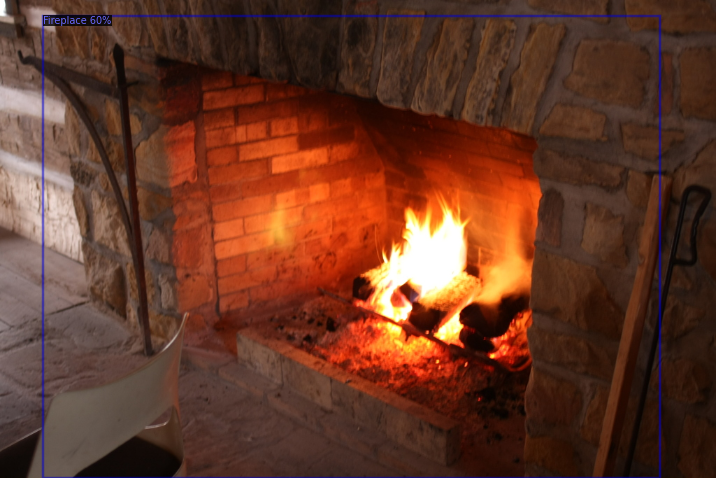

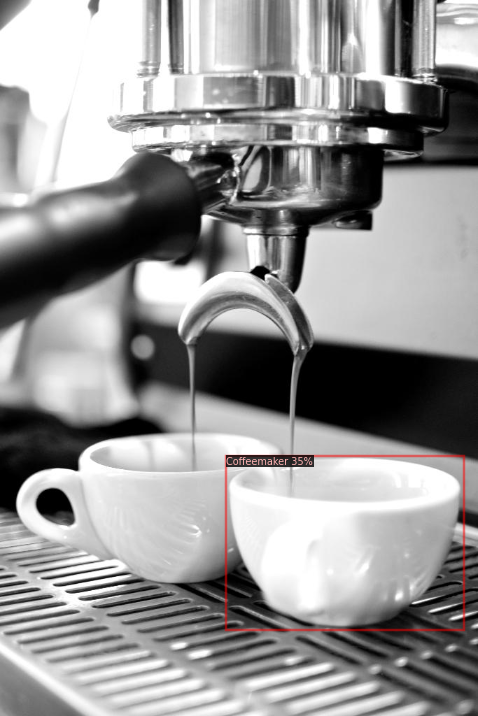

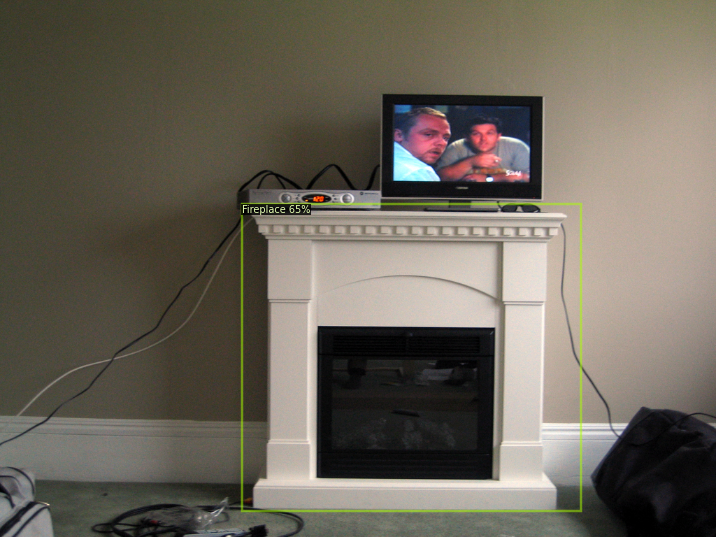

In [ ]:
num_amenities = 1 # how many amenity detections to draw on the image 
for label in random.sample(val_img_dicts, 3): # select random samples from the validation set
  img = cv2.imread(label["file_name"])
  outputs = predictor(img)
  visualizer = Visualizer(img[:, :, ::-1],
                          metadata=cmaker_fireplace_metadata,
                          scale=0.7)
  visualizer = visualizer.draw_instance_predictions(outputs["instances"][:num_amenities].to("cpu"))
  cv2_imshow(visualizer.get_image()[:, :, ::-1])

Wonderful! Looks like our model has learned a thing or two about what a fireplace and coffeemaker looks like.

## Evaluate a custom model

Our model is working on some of our custom data. Now let's get some metrics.

Since we're working on an object detection problem, we can use Detectron2's COCOEvaluater class ([COCO](http://cocodataset.org/#home), common objects in context, is the image dataset Detectron2 models are pretrained on). 

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Setup an evaluator, we use COCO because it's one of the standards for object detection: https://detectron2.readthedocs.io/modules/evaluation.html#detectron2.evaluation.COCOEvaluator
evaluator = COCOEvaluator(dataset_name="cmaker-fireplace-valid", 
                          cfg=cfg, 
                          distributed=False, # use multiple GPUs? we're in Colab so we only use one
                          output_dir="./output/")

# Create a dataloader to load in the test data (cmaker-fireplace-valid)
val_loader = build_detection_test_loader(cfg, 
                                         dataset_name="cmaker-fireplace-valid")

# Make inference on the validation dataset: https://detectron2.readthedocs.io/tutorials/evaluation.html
inference_on_dataset(model=trainer.model, # get the model from the trainer
                     data_loader=val_loader, 
                     evaluator=evaluator)

WARNING [04/29 22:43:48 d2.evaluation.coco_evaluation]: json_file was not found in MetaDataCatalog for 'cmaker-fireplace-valid'. Trying to convert it to COCO format ...
[04/29 22:43:48 d2.data.datasets.coco]: Converting dataset annotations in 'cmaker-fireplace-valid' to COCO format ...)
[04/29 22:43:48 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[04/29 22:43:48 d2.data.datasets.coco]: Conversion finished, num images: 61, num annotations: 62
[04/29 22:43:48 d2.data.datasets.coco]: Caching annotations in COCO format: ./output/cmaker-fireplace-valid_coco_format.json
[04/29 22:43:48 d2.data.common]: Serializing 61 elements to byte tensors and concatenating them all ...
[04/29 22:43:48 d2.data.common]: Serialized dataset takes 0.01 MiB
[04/29 22:43:48 d2.evaluation.evaluator]: Start inference on 61 images
[04/29 22:43:49 d2.evaluation.evaluator]: Inference done 11/61. 0.0657 s / img. ETA=0:00:03
[04/29 22:43:53 d2.evaluation.evaluator]: Total inference time: 0:00:03.92

OrderedDict([('bbox',
              {'AP': 44.85285543654982,
               'AP-Coffeemaker': 50.88657210812707,
               'AP-Fireplace': 38.81913876497257,
               'AP50': 75.08390083433926,
               'AP75': 42.077204428437135,
               'APl': 44.85517611942192,
               'APm': nan,
               'APs': nan})])

Nice! Our model gets about **46-48% AP** ([average precision](https://medium.com/@jonathan_hui/map-mean-average-precision-for-object-detection-45c121a31173)). 

Basically, this metric measures the overlap of our model's predicted boxes with the actual boxes. 

The more the boxes overlap (and select the right class), the higher the metric.

Since we've used `DefaultTrainer`, another way to evalute our model is with `trainer.test()`.

In [ ]:
# Another way to perform inference is with trainer.test()
trainer.test(cfg=cfg,
             model=trainer.model,
             evaluators=evaluator)

[04/29 22:43:53 d2.data.common]: Serializing 61 elements to byte tensors and concatenating them all ...
[04/29 22:43:53 d2.data.common]: Serialized dataset takes 0.01 MiB
[04/29 22:43:53 d2.evaluation.evaluator]: Start inference on 61 images
[04/29 22:43:54 d2.evaluation.evaluator]: Inference done 14/61. 0.0651 s / img. ETA=0:00:03
[04/29 22:43:57 d2.evaluation.evaluator]: Total inference time: 0:00:03.912999 (0.069875 s / img per device, on 1 devices)
[04/29 22:43:57 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:03 (0.066306 s / img per device, on 1 devices)
[04/29 22:43:57 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[04/29 22:43:57 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[04/29 22:43:57 d2.evaluation.coco_evaluation]: Evaluating predictions ...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE 

OrderedDict([('bbox',
              {'AP': 44.85285543654982,
               'AP-Coffeemaker': 50.88657210812707,
               'AP-Fireplace': 38.81913876497257,
               'AP50': 75.08390083433926,
               'AP75': 42.077204428437135,
               'APl': 44.85517611942192,
               'APm': nan,
               'APs': nan})])

### Compare untrained custom model with custom model
Beautiful, now we've got a custom trained model on fireplaces and coffeemakers, let's compare our model to an untrained model (a default one from the Detectron2 model zoo).

First, we'll save our current config file to disk so we can reuse it (this is also a great example of how useful having a config file is).

In [ ]:
# Save config to file
with open("output/config.yaml", "w") as f:
    f.write(cfg.dump())

Next, we'll create a function which is capable of making a prediction on a given image with a given model config and model weights.

In [ ]:
# Make a prediction and display inferences
def make_inference(image, model_config, model_weights, threshold=0.5, n=5):
  """
  Makes inference on image (single image) using model_config, model_weights and threshold.

  Returns image with n instance predictions drawn on.

  Params:
  -------
  image (str) : file path to target image
  model_config (str) : file path to model config in .yaml format
  model_weights (str) : file path to model weights 
  threshold (float) : confidence threshold for model prediction, default 0.5
  n (int) : number of prediction instances to draw on, default 5
    Note: some images may not have 5 instances to draw on depending on threshold,
    n=5 means the top 5 instances above the threshold will be drawn on.
  save (bool) : if True will save image with predicted instances to file, default False
  """

  # Setup config
  cfg = get_cfg()
  cfg.merge_from_file(model_config)
  cfg.MODEL.WEIGHTS = model_weights
  cfg.MODEL.SCORE_THRESH_TEST = threshold

  # Setup predictor
  predictor = DefaultPredictor(cfg)
  img = cv2.imread(image)
  visualizer = Visualizer(img_rgb=img[:, :, ::-1],
                          metadata=MetadataCatalog.get(cfg.DATASETS.TEST[0]),
                          scale=0.7)
  
  outputs = predictor(img) # Outputs: https://detectron2.readthedocs.io/modules/structures.html#detectron2.structures.Instances
  
  # Draw on predictions to image
  visualizer = visualizer.draw_instance_predictions(outputs["instances"][:n].to("cpu"))
  cv2_imshow(visualizer.get_image()[:, :, ::-1])

To compare our trained model and an untrained model, let's get a custom image from my kitchen.

In [ ]:
# Get an example image from the wild (my kitchen) of a coffeemaker
!wget https://raw.githubusercontent.com/mrdbourke/airbnb-amenity-detection/master/custom_images/coffeemaker.jpg
cmaker = cv2.imread("coffeemaker.jpg")
cv2_imshow(cmaker)

Delicious. Now let's make a prediction on the image using our custom model (`ouput/model_final.pth`).

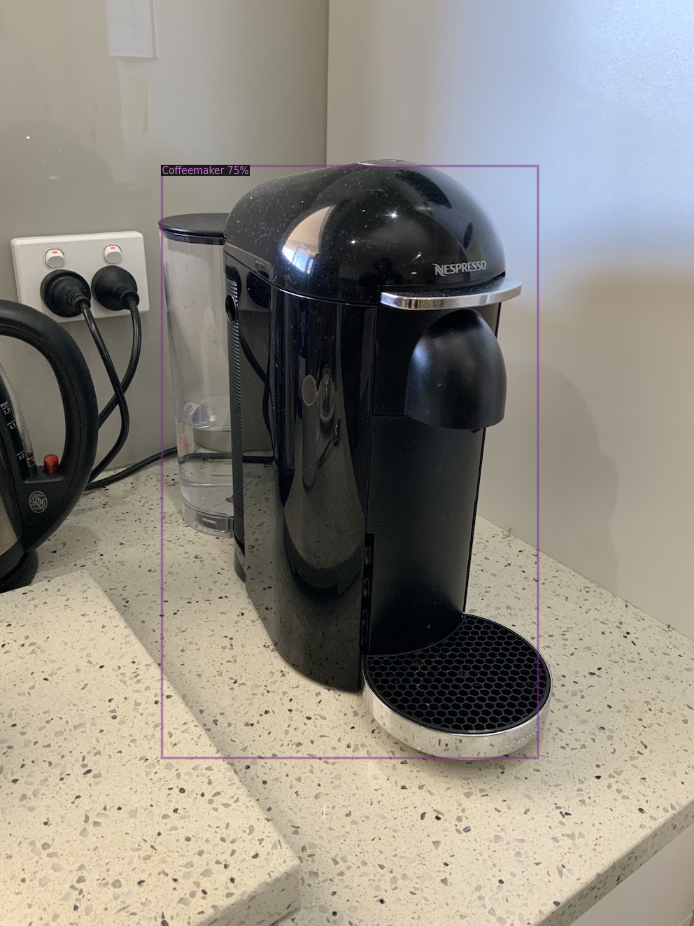

In [ ]:
# Make a prediction with the custom model
make_inference("coffeemaker.jpg",
               model_config="output/config.yaml",
               model_weights="output/model_final.pth",
               n=1)

And we'll do the same with a non-custom model, the same one we used as the baseline of our custom model.

We can import it straight from Detectron2's model zoo.

Loading config /usr/local/lib/python3.6/dist-packages/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


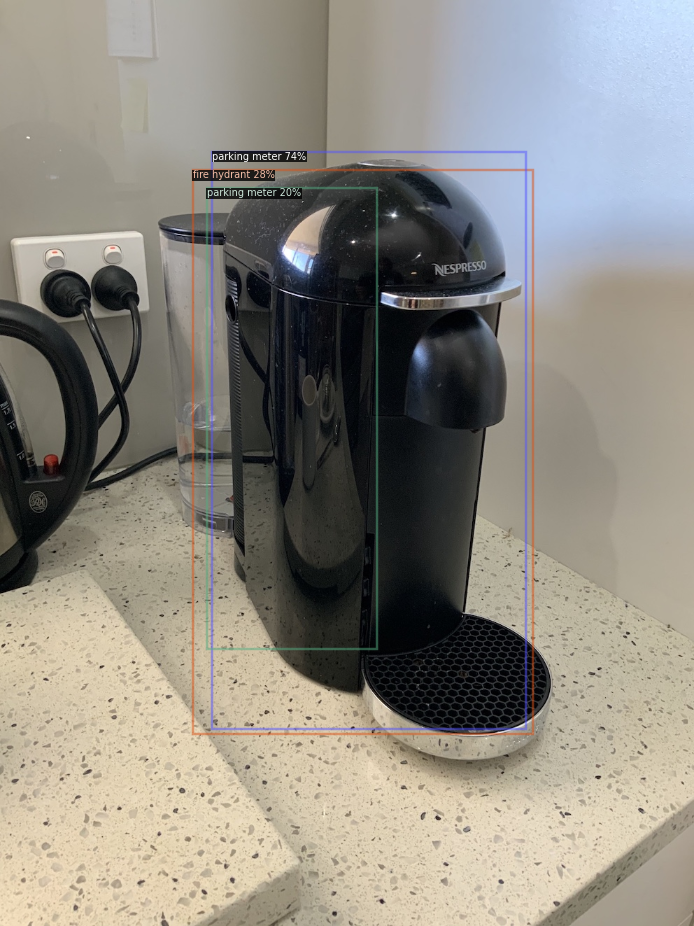

In [ ]:
# Non-custom model
make_inference("coffeemaker.jpg",
               model_config=model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_3x.yaml"),
               model_weights=model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_50_FPN_3x.yaml"),
               n=3)

How cool is that? 

After only 300 iterations of training, our custom model is able to pick out the coffeemaker in the image. Where as, the non-custom model detects some regions of interest (ROI's) except none of them are labelled with coffeemaker.

## Extensions & full model training

So far we've gone through an example of how you might start to replicate Airbnb's amenity detection with Detectron2.

But this example notebook has only gone through creating a model on 2 classes (firepalce & coffeemaker), where as, Airbnb's amenity detection article states they looked at 30 different classes (see `target_classes`).

Some ideas for next steps you could take are:
- Download the full dataset from Open Images (see below)
- Create labels for the full dataset using the preprocessing code above
- Train a Detectron2 model using `DefaultTrainer` or [`plain_train_net.py`](https://github.com/facebookresearch/detectron2/tree/master/tools) and the full dataset
- Track your modelling experiments with [Weights & Biases](https://www.wandb.com/)
  - **Note:** If you want to see an example of what experiment tracking with Weights & Biases look like, you can check out the [airbnb-amenity-detection Weights & Biases run page](https://app.wandb.ai/mrdbourke/airbnb-amenity-detection) (it's how I tracked my experiments for for the full model).

In [ ]:
# # Example of how you'd download the entire Open Images Airbnb amenity detection subset
# # Note: running these will download ~12GB of images.
# # After downloading, preprocessing is the same as above.

# # Validation
# !python3 downloadOI.py --dataset "validation" --classes 'Toilet,Swimming pool,Bed,Billiard table,Sink,Fountain,Oven,Ceiling fan,Television,Microwave oven,Gas stove,Refrigerator,Kitchen & dining room table,Washing machine,Bathtub,Stairs,Fireplace,Pillow,Mirror,Shower,Couch,Countertop,Coffeemaker,Dishwasher,Sofa bed,Tree house,Towel,Porch,Wine rack,Jacuzzi'

# # Training
# !python3 downloadOI.py --dataset "train" --classes 'Toilet,Swimming pool,Bed,Billiard table,Sink,Fountain,Oven,Ceiling fan,Television,Microwave oven,Gas stove,Refrigerator,Kitchen & dining room table,Washing machine,Bathtub,Stairs,Fireplace,Pillow,Mirror,Shower,Couch,Countertop,Coffeemaker,Dishwasher,Sofa bed,Tree house,Towel,Porch,Wine rack,Jacuzzi'

# # Test dataset
# !python3 downloadOI.py --dataset "test" --classes 'Toilet,Swimming pool,Bed,Billiard table,Sink,Fountain,Oven,Ceiling fan,Television,Microwave oven,Gas stove,Refrigerator,Kitchen & dining room table,Washing machine,Bathtub,Stairs,Fireplace,Pillow,Mirror,Shower,Couch,Countertop,Coffeemaker,Dishwasher,Sofa bed,Tree house,Towel,Porch,Wine rack,Jacuzzi'
